In [1]:
import numpy as np
import pygimli as pg
import pybert as pb
from pygimli.physics import ert
from pygimli.physics.ert.importData import importRes2dInv
import matplotlib.pyplot as plt
import pygimli.meshtools as mt
import pandas as pd
import pickle
from datetime import datetime
from glob import glob
from scipy.interpolate import interp1d
from matplotlib.backends.backend_pdf import PdfPages

In [33]:
dir = "//smb.isipd.dmawi.de/projects/p_thinice/06_data/ERT_data/"

In [34]:
f38_v1_1 = ert.load(dir + 'raw_data/kamik_f38_v1_01.txt')
f38_v1_2 = ert.load(dir + 'raw_data/kamik_f38_v1_02.txt')
f38_v1_3 = ert.load(dir + 'raw_data/kamik_f38_v1_03.txt')
f38_v1_4 = ert.load(dir + 'raw_data/kamik_f38_v1_04.txt')
f38_v1_5 = ert.load(dir + 'raw_data/kamik_f38_v1_05.txt')
f38_diag1_1 = ert.load(dir + 'raw_data/kamik_f38_diag1_01.txt')
f38_diag1_2 = ert.load(dir + 'raw_data/kamik_f38_diag1_02.txt')
f38_diag1_3 = ert.load(dir + 'raw_data/kamik_f38_diag1_03.txt')
f38_v1_topo = pd.read_csv(dir + 'topo_data/kamik_f38_v1_topo.txt', sep='\s+', header=None)
f38_diag1_topo = pd.read_csv(dir + 'topo_data/kamik_f38_diag1_topo.txt', sep='\s+', header=None)


In [35]:
f38_v1_5 = ert.load(dir + 'raw_data/kamik_f38_v1_05_with_errmodel.txt')
f38_v1_topo = pd.read_csv(dir + 'topo_data/kamik_f38_v1_topo.txt', sep='\s+', header=None)

In [1]:
f38_v1_5

NameError: name 'f38_v1_5' is not defined

In [92]:
f38_v1_1['a'], f38_v1_1['m'] = f38_v1_1['m'].copy(), f38_v1_1['a'].copy()
f38_v1_1['b'], f38_v1_1['n'] = f38_v1_1['n'].copy(), f38_v1_1['b'].copy()

In [36]:
v1 = [f38_v1_1, f38_v1_2, f38_v1_3, f38_v1_4, f38_v1_5]

In [22]:
v1[4]['err'] = v1[4]['err']*v1[4]['u']/v1[4]['i']

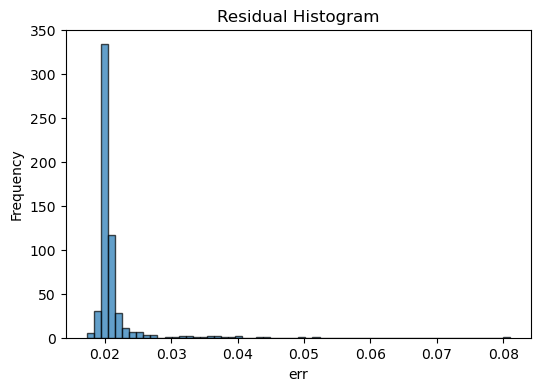

In [37]:
plt.figure(figsize=(6,4))
plt.hist(v1[4]['err'], bins=60, edgecolor='k', alpha=0.7)
plt.xlabel('err')
plt.ylabel('Frequency')
plt.title('Residual Histogram')
plt.show()

Slope: 0.00034139831400454277
Intercept: 0.019988297331886336


Text(0, 0.5, 'err')

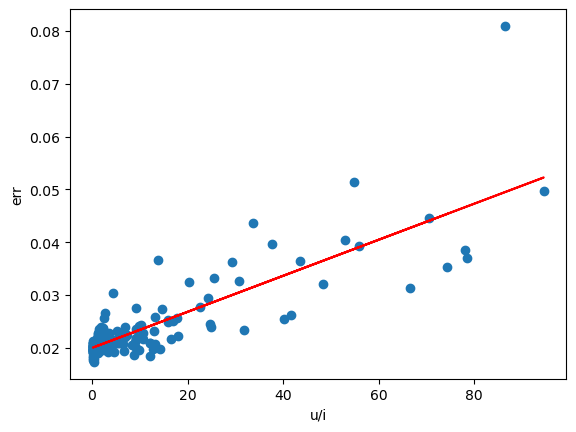

In [38]:
x = v1[4]['u'] / v1[4]['i']
y = v1[4]['err']

# Fit a line (degree 1 polynomial)
slope, intercept = np.polyfit(x, y, 1)

print("Slope:", slope)
print("Intercept:", intercept)

# Plot the data and the fitted line
plt.scatter(x, y, label='Data')
plt.plot(x, slope*x + intercept, color='red', label='Fitted line')
plt.xlabel('u/i')
plt.ylabel('err')

In [39]:
np.median(v1[4]['err'])


0.02031186

In [43]:
v1[4]['r'] = v1[4]['u']/v1[4]['i']

In [41]:
v1[4].remove(v1[4]['err']>=0.08)

In [321]:
#v1[2]['err'] = ert.estimateError(v1[2], relativeError=0.02, absoluteUError=v1[2]['err'])
#v1[3]['err'] = ert.estimateError(v1[3], relativeError=0.02, absoluteUError=v1[3]['err'])
v1[4]['err'] = ert.estimateError(v1[4], relativeError=0.003, absoluteError=3.0e-05)
v1[4]['r'] = v1[4]['u']/v1[4]['i']

In [116]:
for i in v1[2:4]:
    i.remove(i['err'] >= 0.05)

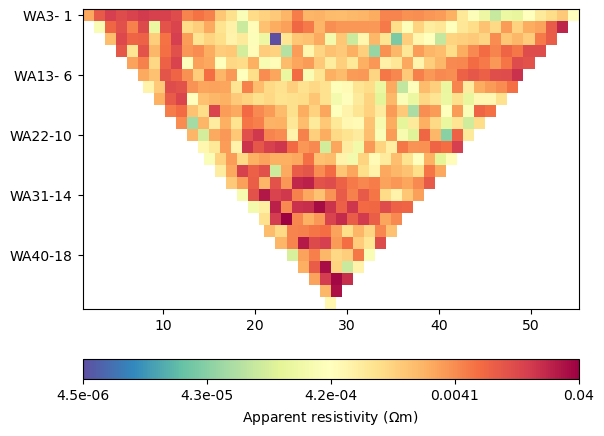

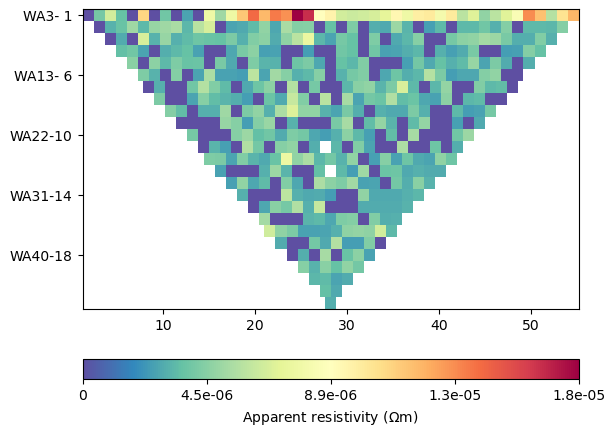

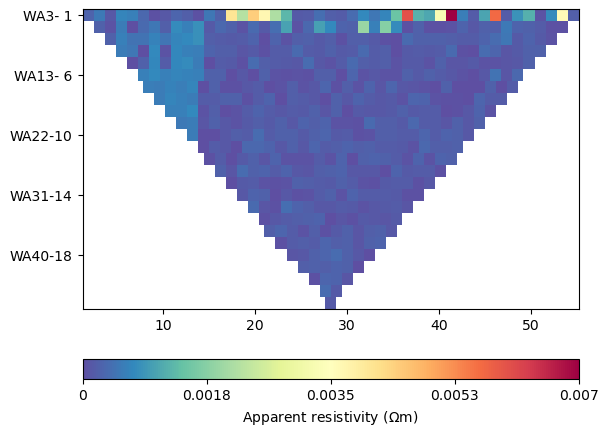

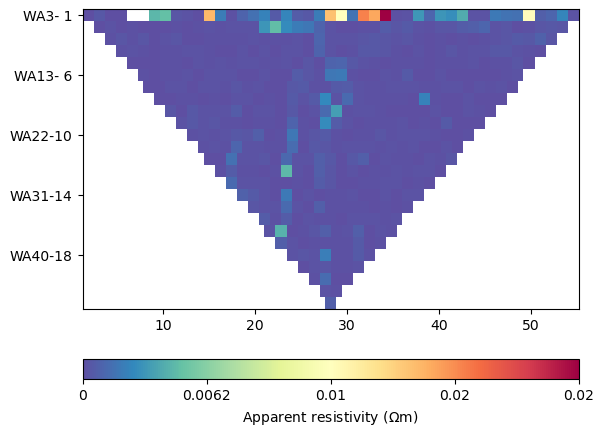

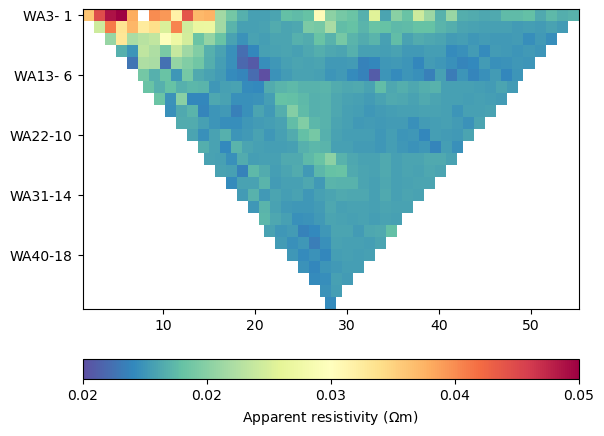

In [42]:
for i in v1:
    ert.showData(i, i['err'])

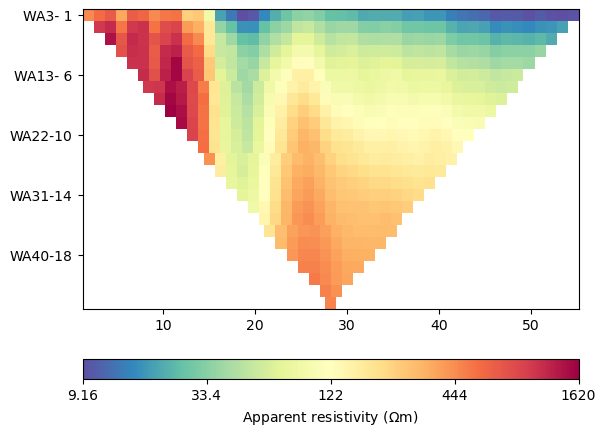

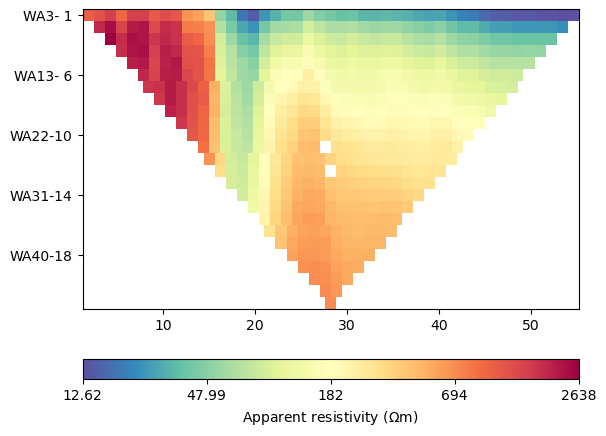

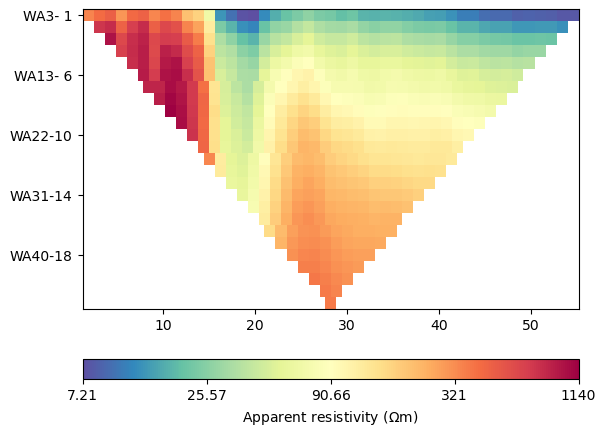

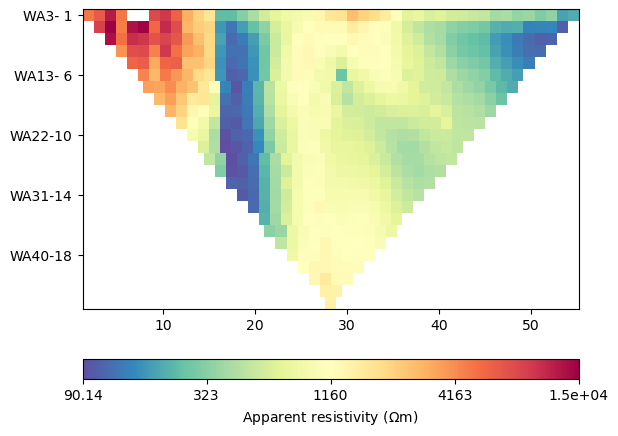

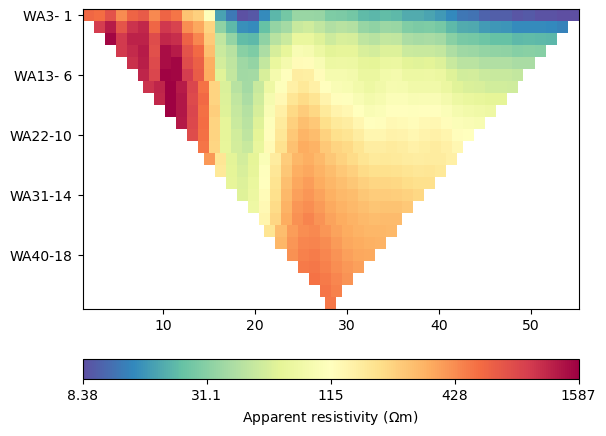

In [243]:
for i in v1:
    ert.showData(i)

Recalculating the geometric factor based on topography 

In [44]:
#for data in v1:
#    data["k0"] = ert.createGeometricFactors(data)
#    data["r"] = data["rhoa"]/data["k0"]

for data in v1:
    for i in range(data.sensorCount()):
        x_new = f38_v1_topo[0][i]  # Get x-value from diag1_topo[0]
        y_new = f38_v1_topo[1][i]  # Get y-value from diag1_topo[1]
        data.setSensorPosition(i, [x_new, y_new])

for data in v1:
    data["k"] = ert.createGeometricFactors(data, numerical=True)
    data["rhoa"] = data["r"]*data["k"]

01/10/25 - 16:48:19 - pyGIMLi - INFO - Cache c:\Users\mealiy001\AppData\Local\anaconda3\envs\pgcore\Lib\site-packages\pygimli\physics\ert\ert.py:createGeometricFactors restored (7.7s x 14): C:\Users\mealiy001\AppData\Roaming\pygimli\Cache\2399477887932424150


01/10/25 - 16:48:19 - pyGIMLi - INFO - Cache c:\Users\mealiy001\AppData\Local\anaconda3\envs\pgcore\Lib\site-packages\pygimli\physics\ert\ert.py:createGeometricFactors restored (7.4s x 13): C:\Users\mealiy001\AppData\Roaming\pygimli\Cache\6990903143257518156
01/10/25 - 16:48:19 - pyGIMLi - INFO - Cache c:\Users\mealiy001\AppData\Local\anaconda3\envs\pgcore\Lib\site-packages\pygimli\physics\ert\ert.py:createGeometricFactors restored (8.5s x 11): C:\Users\mealiy001\AppData\Roaming\pygimli\Cache\5304172707840413513
01/10/25 - 16:48:19 - pyGIMLi - INFO - Cache c:\Users\mealiy001\AppData\Local\anaconda3\envs\pgcore\Lib\site-packages\pygimli\physics\ert\ert.py:createGeometricFactors restored (6.3s x 11): C:\Users\mealiy001\AppData\Roaming\pygimli\Cache\6706186041988734089
01/10/25 - 16:48:19 - pyGIMLi - INFO - Create default mesh for geometric factor calculation.
01/10/25 - 16:48:26 - pyGIMLi - INFO - Save RVector binary
01/10/25 - 16:48:26 - pyGIMLi - INFO - Cache stored: C:\Users\mealiy001

Active layer integration:

In [ ]:
struct = pd.read_csv(dir + "inversions/kamik_pandas_veg_struct.txt", header=None, sep="\s+")
interpolated_topography = interp1d(f38_diag1_topo[0], f38_diag1_topo[1], kind='cubic', fill_value='extrapolate')

xnew = np.arange(0, 95, 1)

ynew = interpolated_topography(xnew)
plt.plot(f38_diag1_topo[0], f38_diag1_topo[1], 'o', xnew, ynew, '-')

xnew_struct = np.arange(0, 82, 1)
interpolated_struct = interp1d(struct[0], struct[1], kind='linear', fill_value='extrapolate')
ynew_struct = interpolated_struct(xnew_struct)
plt.plot(struct[0], struct[1], 'o', xnew_struct, ynew_struct, '-')

Time lapse preparation

In [124]:
timeposs=[
        '10/08/2023 10:30',
        '25/06/2024 10:30',
        '16/08/2024 10:30',
        '16/03/2025 10:30',
        '26/08/2025 10:30',]


dates= [str(datetime.strptime(t, "%d/%m/%Y %H:%M")) for t in timeposs]

timepos= [datetime.fromisoformat(x) for x in dates]

In [59]:
plc = mt.createParaMeshPLC(v1[4], paraMaxCellSize=0.1)
mesh = mt.createMesh(plc)

In [126]:
tl = ert.TimelapseERT(v1, times=timepos, mesh=mesh)

25/09/25 - 21:40:07 - pyGIMLi - INFO - Found 2 regions.
25/09/25 - 21:40:07 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (1) set to background.
25/09/25 - 21:40:07 - pyGIMLi - INFO - Save RVector binary
25/09/25 - 21:40:07 - pyGIMLi - INFO - Cache stored: C:\Users\mealiy001\AppData\Roaming\pygimli\Cache\3446211315611051187


<Axes: xlabel='time', ylabel='resistivity (Ohmm)'>

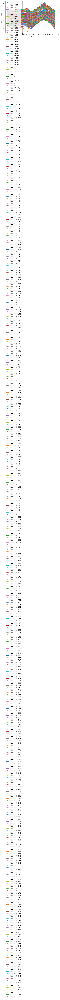

In [213]:
tl.showTimeline()

In [214]:
tl.generateDataPDF()

<Figure size 500x500 with 0 Axes>

Inversion

In [ ]:
mgr = ert.ERTManager(v1[4])
inv = mgr.invert(v1[4], mesh=mesh, verbose=True, lam=50, zWeight=0.1, robustData=True, blockyModel=True)
mgr.showResultAndFit()

01/10/25 - 19:19:33 - pyGIMLi - INFO - Found 2 regions.
01/10/25 - 19:19:33 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (1) set to background.
01/10/25 - 19:19:33 - pyGIMLi - INFO - Creating forward mesh from region infos.
01/10/25 - 19:19:35 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
01/10/25 - 19:19:38 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 55584 Cells: 110732 Boundaries: 83266
01/10/25 - 19:19:40 - pyGIMLi - INFO - Use median(data values)=122.26257455439475
01/10/25 - 19:19:40 - pyGIMLi - INFO - Created startmodel from forward operator:25632, min/max=122.262575/122.262575
01/10/25 - 19:19:40 - pyGIMLi - INFO - Starting inversion.


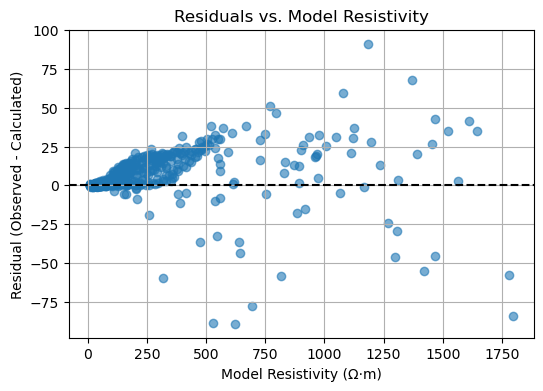

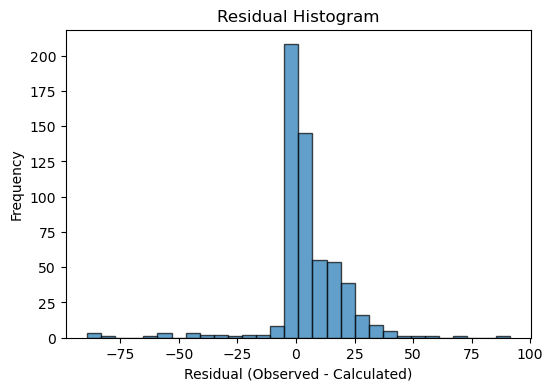

In [65]:
d_calc = mgr.inv.response.array()  # calculated apparent resistivity
d_obs = mgr.data['rhoa']
residuals = d_obs - d_calc


plt.figure(figsize=(6,4))
plt.scatter(d_calc, residuals, alpha=0.6)
plt.axhline(0, color='k', linestyle='--')
plt.xlabel('Model Resistivity (Ω·m)')
plt.ylabel('Residual (Observed - Calculated)')
plt.title('Residuals vs. Model Resistivity')
plt.grid(True)
plt.show()

plt.figure(figsize=(6,4))
plt.hist(residuals, bins=30, edgecolor='k', alpha=0.7)
plt.xlabel('Residual (Observed - Calculated)')
plt.ylabel('Frequency')
plt.title('Residual Histogram')
plt.show()

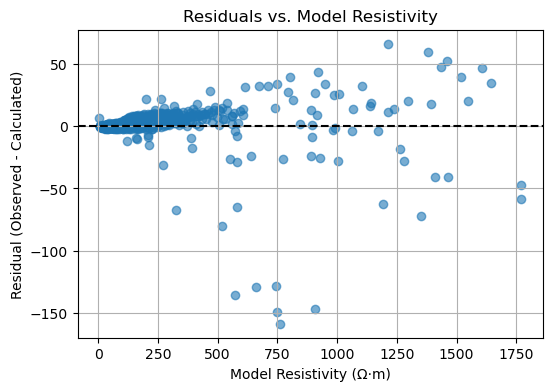

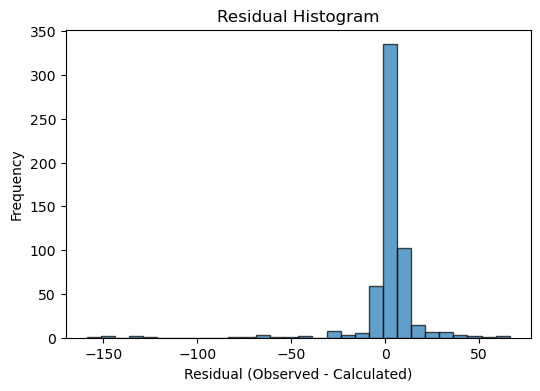

In [48]:
d_calc = mgr.inv.response.array()  # calculated apparent resistivity
d_obs = mgr.data['rhoa']
residuals = d_obs - d_calc


plt.figure(figsize=(6,4))
plt.scatter(d_calc, residuals, alpha=0.6)
plt.axhline(0, color='k', linestyle='--')
plt.xlabel('Model Resistivity (Ω·m)')
plt.ylabel('Residual (Observed - Calculated)')
plt.title('Residuals vs. Model Resistivity')
plt.grid(True)
plt.show()

plt.figure(figsize=(6,4))
plt.hist(residuals, bins=30, edgecolor='k', alpha=0.7)
plt.xlabel('Residual (Observed - Calculated)')
plt.ylabel('Frequency')
plt.title('Residual Histogram')
plt.show()

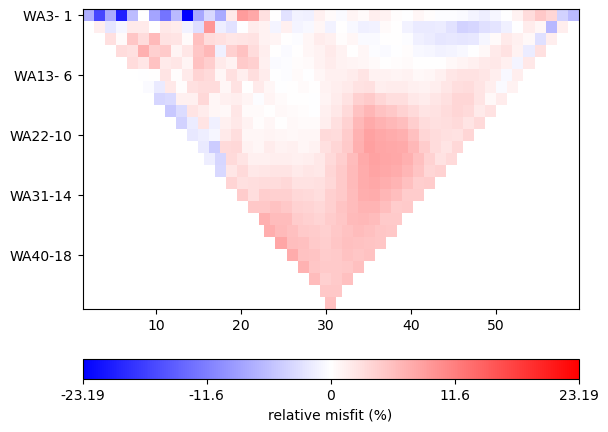

In [67]:
mgr.showMisfit()

In [127]:
tl.invert(lam=50, verbose=True, zWeight=0.5)

25/09/25 - 21:40:15 - pyGIMLi - INFO - Creating forward mesh from region infos.
25/09/25 - 21:40:16 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
25/09/25 - 21:40:16 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 12622 Cells: 24972 Boundaries: 18864
25/09/25 - 21:40:17 - pyGIMLi - INFO - Starting inversion.
25/09/25 - 21:40:17 - pyGIMLi - INFO - Setting starting model as reference!


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x0000021DBE63DAD0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 9.17/1622
min/max (error): 3%/3%
min/max (start model): 100/100
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1577.77
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  182.39 (dPhi = 88.09%) lam: 50.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   88.89 (dPhi = 50.65%) lam: 50.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    6.09 (dPhi = 87.35%) lam: 50.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    2.99 (dPhi = 31.68%) lam: 50.0
-

25/09/25 - 21:45:39 - pyGIMLi - INFO - Starting inversion.
25/09/25 - 21:45:39 - pyGIMLi - INFO - Setting starting model as reference!


chi² =    1.98 (dPhi = 0.62%) lam: 50.0
################################################################################
#                Abort criterion reached: dPhi = 0.62 (< 2.0%)                 #
################################################################################
fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x0000021DBE63DAD0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 12.64/2632
min/max (error): 3%/1.0e+10%
min/max (start model): 3.47/7453
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  289.90
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    2.68 (dPhi = 98.76%) lam: 50.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    1.27 (dPhi = 4

25/09/25 - 21:48:24 - pyGIMLi - INFO - Starting inversion.
25/09/25 - 21:48:24 - pyGIMLi - INFO - Setting starting model as reference!


chi² =    0.90 (dPhi = 16.59%) lam: 50.0


################################################################################
#                  Abort criterion reached: chi² <= 1 (0.90)                   #
################################################################################
fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x0000021DBE63DAD0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 7.34/1141
min/max (error): 3%/3%
min/max (start model): 3.47/7453
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   62.22
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    1.29 (dPhi = 97.52%) lam: 50.0
--------------------------------------------------------------------------------
inv.iter 2 ... 

25/09/25 - 21:50:59 - pyGIMLi - INFO - Starting inversion.
25/09/25 - 21:50:59 - pyGIMLi - INFO - Setting starting model as reference!


chi² =    0.75 (dPhi = 34.46%) lam: 50.0


################################################################################
#                  Abort criterion reached: chi² <= 1 (0.75)                   #
################################################################################
fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x0000021DBE63DAD0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 91.24/1.5e+04
min/max (error): 3%/1.0e+10%
min/max (start model): 3.47/7453
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 3931.21
--------------------------------------------------------------------------------
inv.iter 1 ... chi² = 3692.14 (dPhi = 6.08%) lam: 50.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² = 3183.22 (dPh

25/09/25 - 21:57:05 - pyGIMLi - INFO - Starting inversion.
25/09/25 - 21:57:05 - pyGIMLi - INFO - Setting starting model as reference!


chi² =    4.37 (dPhi = 0.59%) lam: 50.0
################################################################################
#                Abort criterion reached: dPhi = 0.59 (< 2.0%)                 #
################################################################################
fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x0000021DBE63DAD0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 8.4/1587
min/max (error): 3%/3%
min/max (start model): 3.47/7453
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =    8.32
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    1.25 (dPhi = 79.26%) lam: 50.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    0.91 (dPhi = 25.88%) l

array([[<Axes: xlabel='$x$ in m', ylabel='Depth in m'>,
        <Axes: xlabel='$x$ in m', ylabel='Depth in m'>],
       [<Axes: xlabel='$x$ in m', ylabel='Depth in m'>,
        <Axes: xlabel='$x$ in m', ylabel='Depth in m'>],
       [<Axes: xlabel='$x$ in m', ylabel='Depth in m'>, <Axes: >]],
      dtype=object)

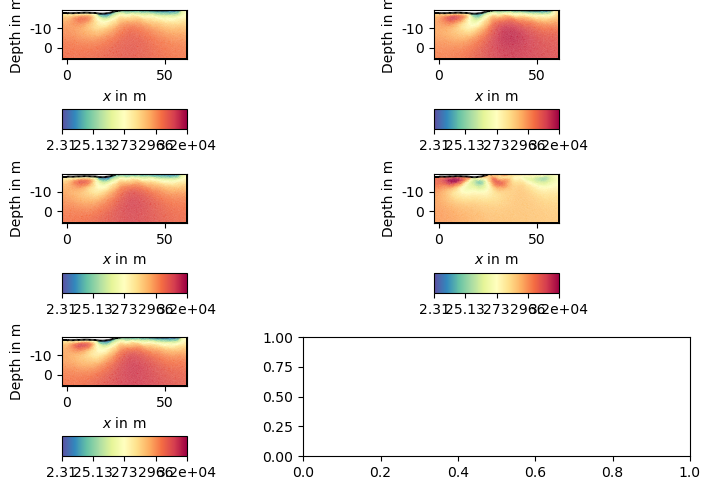

In [128]:
tl.showAllModels()

Text(0.5, 1.0, 'Freezing period 2024/2025')

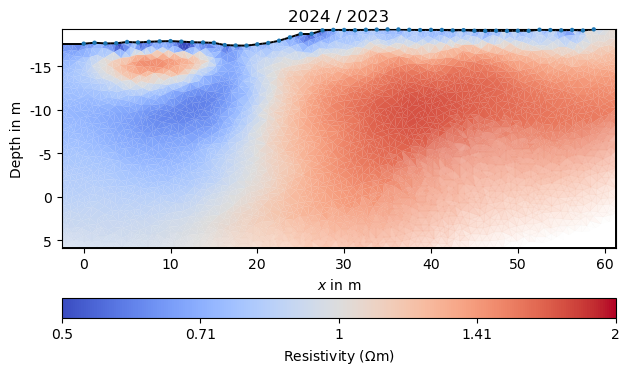

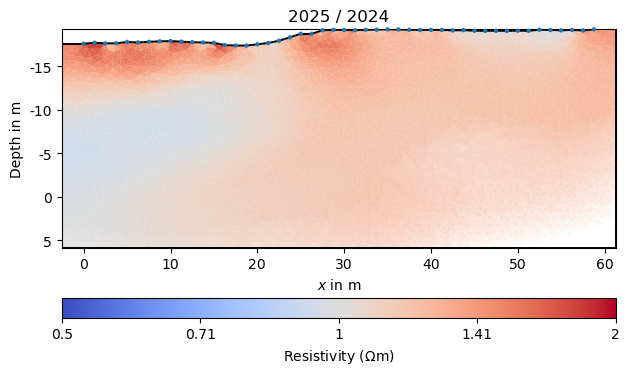

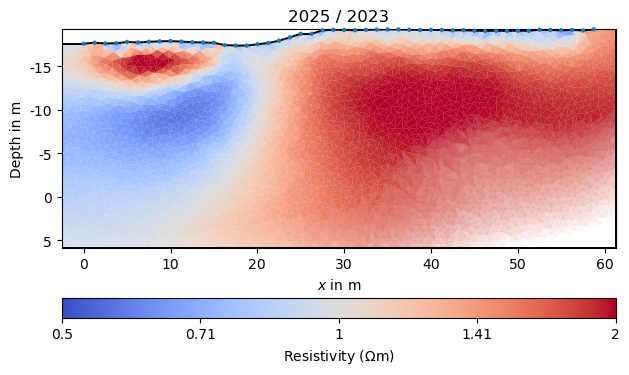

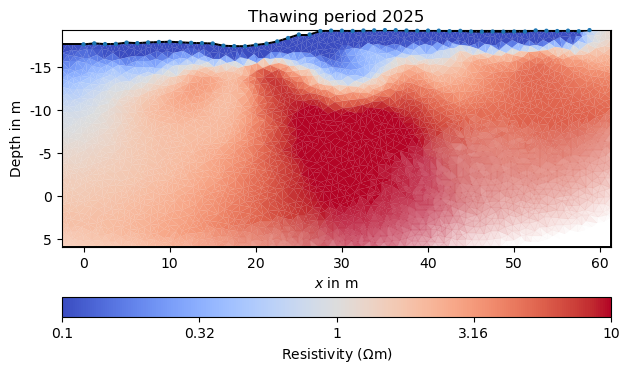

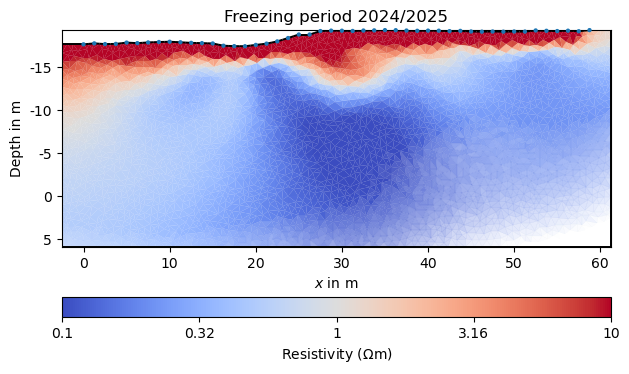

In [ ]:
ax, cb = tl.mgr.showResult(tl.models[2]/tl.models[0], cMap='coolwarm', cMin=0.5, cMax=2)
ax.set_title('2024 / 2023')

ax, cb = tl.mgr.showResult(tl.models[4]/tl.models[2], cMap='coolwarm', cMin=0.5, cMax=2)
ax.set_title('2025 / 2024')

ax, cb = tl.mgr.showResult(tl.models[4]/tl.models[0], cMap='coolwarm', cMin=0.5, cMax=2)
ax.set_title('2025 / 2023')


ax, cb = tl.mgr.showResult(tl.models[4]/tl.models[3], cMap='coolwarm', cMin=0.1, cMax=10)
ax.set_title('Thawing period 2025')

ax, cb = tl.mgr.showResult(tl.models[3]/tl.models[2], cMap='coolwarm', cMin=0.1, cMax=10)
ax.set_title('Freezing period 2024/2025')

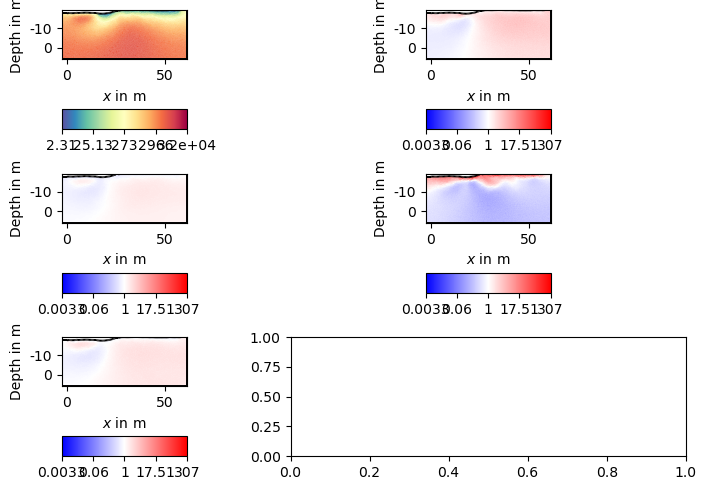

In [130]:
ax = tl.showAllModels(ratio=True)

In [226]:
#tl.generateDataPDF()  # pseudosections
tl.generateModelPDF(cMin=10, cMax=10000)
tl.generateRatioPDF()

<Figure size 800x500 with 0 Axes>

<Figure size 800x500 with 0 Axes>

In [224]:
tl.fullInversion(lam=20, verbose=True, zWeight=0.5, scalef=0.5)

11/09/25 - 13:52:03 - pyGIMLi - INFO - Found 2 regions.
11/09/25 - 13:52:03 - pyGIMLi - INFO - Region with smallest marker (1) set to background
11/09/25 - 13:52:03 - pyGIMLi - INFO - Creating forward mesh from region infos.
11/09/25 - 13:52:03 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
11/09/25 - 13:52:04 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 12622 Cells: 24972 Boundaries: 18864
11/09/25 - 13:52:07 - pyGIMLi - INFO - Starting inversion.


5197 model cells
Mesh: Nodes: 12622 Cells: 24972 Boundaries: 18864
fop: <pygimli.frameworks.timelapse.MultiFrameModelling object at 0x0000017B5B6F38D0>
Data transformation: Identity transform
Model transformation: Logarithmic transform
min/max (data): 3.32/1.5e+04
min/max (error): 3%/1.0e+10%
min/max (start model): 182/182
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 13576.13
--------------------------------------------------------------------------------
inv.iter 1 ... chi² = 1414.91 (dPhi = 89.28%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  605.08 (dPhi = 56.50%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =  463.91 (dPhi = 22.84%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =  357.86 (dPhi = 22.60%) lam: 20.0
---------------

25985 [31.443144114705007,...,1290.0819002825674]

Text(0.5, 1.0, 'Freezing period 2024/2025')

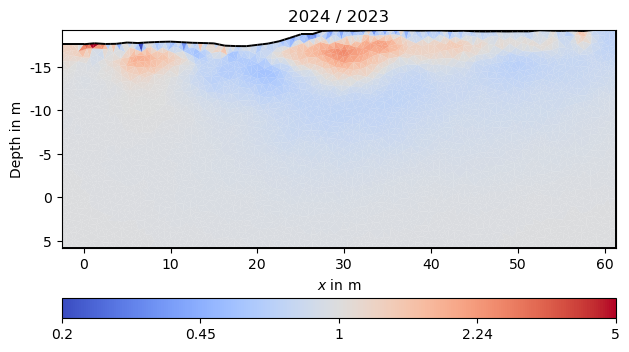

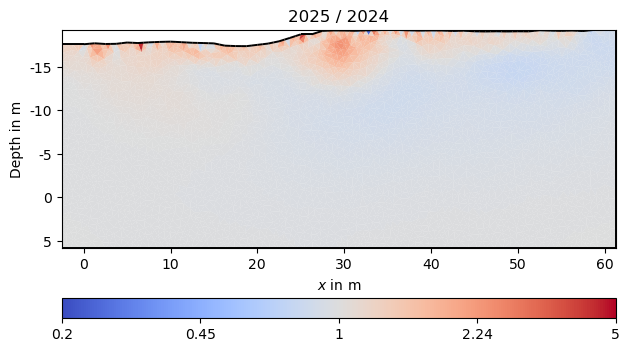

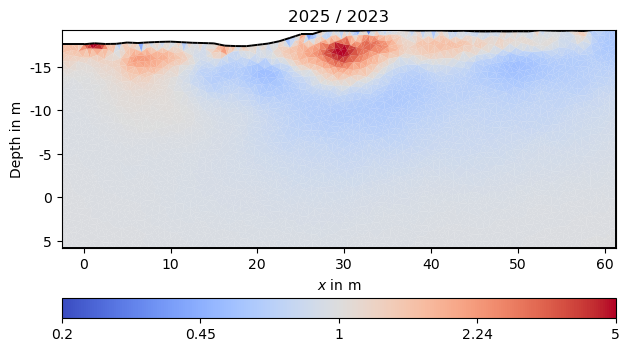

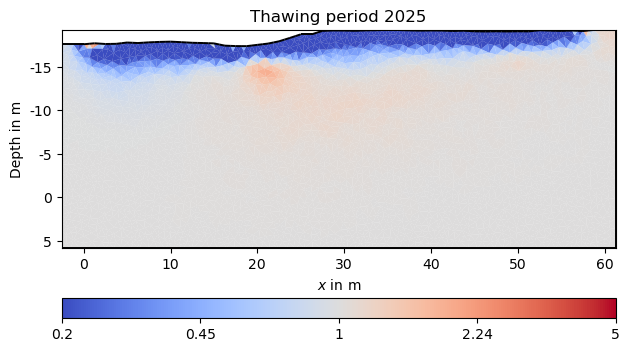

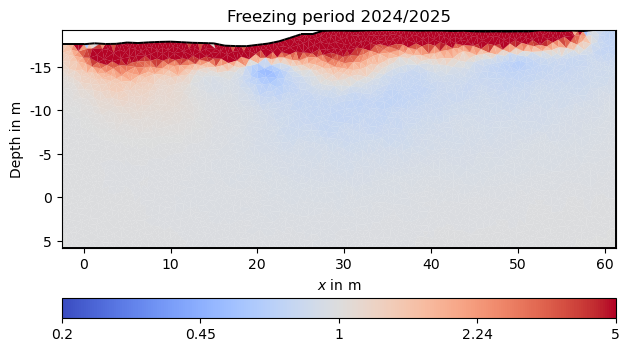

In [227]:
fak = 5
diffkw = dict(cMap="coolwarm", cMin=1/fak, cMax=fak, logScale=1)

ax, cb = pg.show(tl.mgr.paraDomain,tl.models[2]/tl.models[0], **diffkw)
ax.set_title('2024 / 2023')

ax, cb = pg.show(tl.mgr.paraDomain,tl.models[4]/tl.models[2], **diffkw)
ax.set_title('2025 / 2024')

ax, cb = pg.show(tl.mgr.paraDomain,tl.models[4]/tl.models[0], **diffkw)
ax.set_title('2025 / 2023')

ax, cb = pg.show(tl.mgr.paraDomain,tl.models[4]/tl.models[3], **diffkw)
ax.set_title('Thawing period 2025')

ax, cb = pg.show(tl.mgr.paraDomain,tl.models[3]/tl.models[2], **diffkw)
ax.set_title('Freezing period 2024/2025')

In [255]:
timeposs

['10/08/2023 10:30',
 '25/06/2024 10:30',
 '16/08/2024 10:30',
 '16/03/2025 10:30',
 '26/08/2025 10:30']

C:\Users\mealiy001\AppData\Local\Temp\ipykernel_15856\2140893082.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels([f"{tick:.1f}" for tick in relative_ticks1])
C:\Users\mealiy001\AppData\Local\Temp\ipykernel_15856\2140893082.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels([f"{tick:.1f}" for tick in relative_ticks1])
C:\Users\mealiy001\AppData\Local\Temp\ipykernel_15856\2140893082.py:29: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels([f"{tick:.1f}" for tick in relative_ticks1])
C:\Users\mealiy001\AppData\Local\Temp\ipykernel_15856\2140893082.py:48: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  a

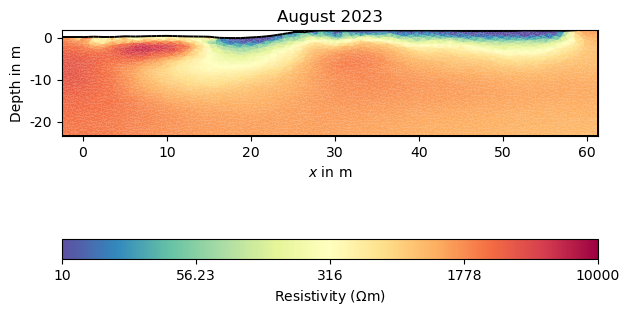

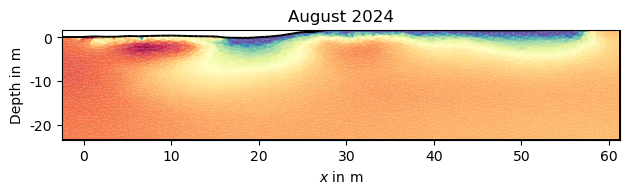

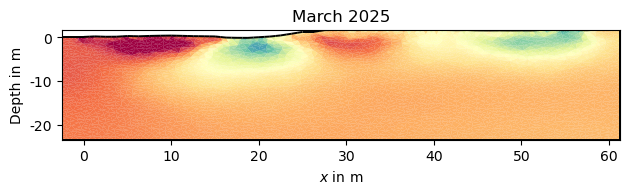

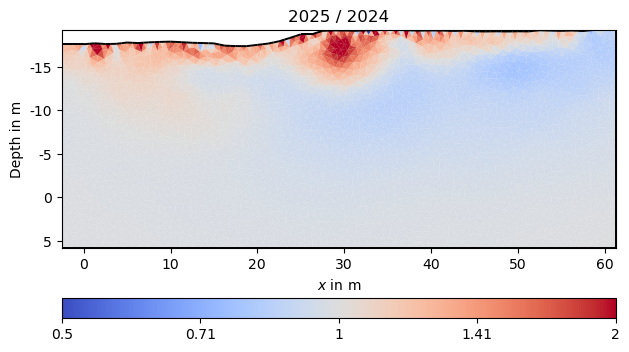

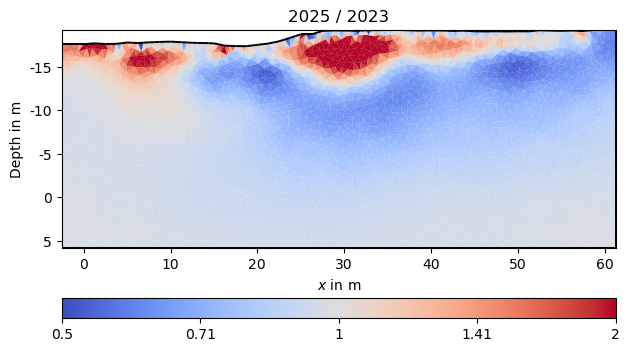

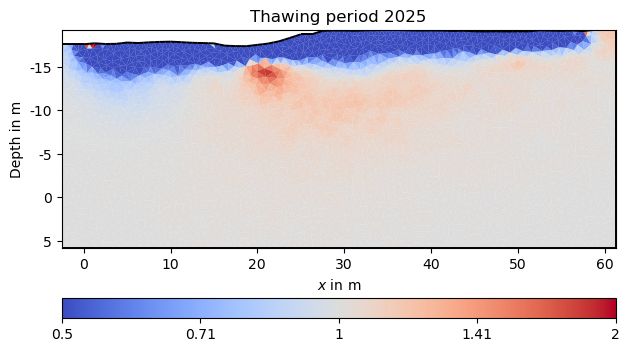

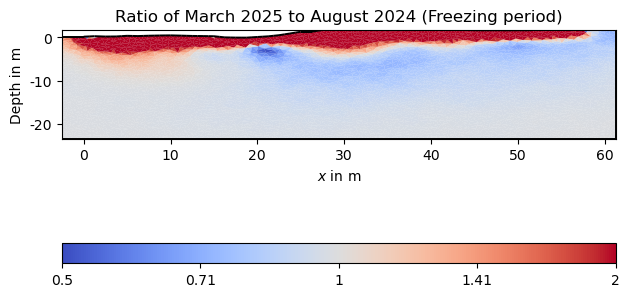

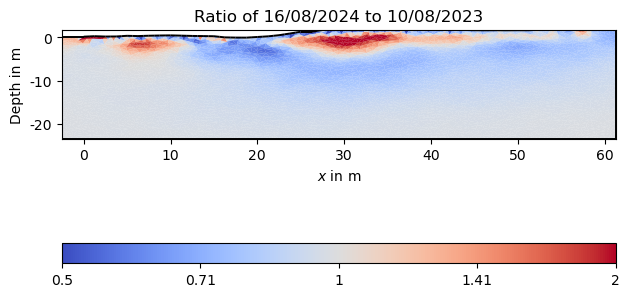

In [264]:
fak = 2
diffkw = dict(cMap="coolwarm", cMin=1/fak, cMax=fak, logScale=1)
desired_ticks = np.arange(0, -21, -10)
ax, cb = pg.show(tl.mgr.paraDomain, tl.models[0], cMap="Spectral_r", logScale=True, cMin=10, cMax=10000)
ax.set_title('August 2023')
current_ticks1 = ax.get_yticks()
relative_ticks1 = current_ticks1-17.5
ax.set_yticklabels([f"{tick:.1f}" for tick in relative_ticks1])
ax.set_yticks(desired_ticks + 17.5)
ax.set_yticklabels([f"{tick}" for tick in desired_ticks])
ax.set_aspect(0.5)
cb.set_label("Resistivity ($\Omega$m)")
plt.savefig("//smb.isipd.dmawi.de/projects/sparc/personal_accounts/Mehriban/posters/kamik_august2023.png", bbox_inches='tight')

ax, cb = pg.show(tl.mgr.paraDomain, tl.models[2], cMap="Spectral_r", logScale=True, cMin=10, cMax=10000, colorBar=False)
ax.set_title('August 2024')
current_ticks1 = ax.get_yticks()
relative_ticks1 = current_ticks1-17.5
ax.set_yticklabels([f"{tick:.1f}" for tick in relative_ticks1])
ax.set_yticks(desired_ticks + 17.5)
ax.set_yticklabels([f"{tick}" for tick in desired_ticks])
ax.set_aspect(0.5)
plt.savefig("//smb.isipd.dmawi.de/projects/sparc/personal_accounts/Mehriban/posters/kamik_august2024.png", bbox_inches='tight')

ax, cb = pg.show(tl.mgr.paraDomain, tl.models[3], cMap="Spectral_r", logScale=True, cMin=10, cMax=10000, colorBar=False)
ax.set_title('March 2025')
current_ticks1 = ax.get_yticks()
relative_ticks1 = current_ticks1-17.5
ax.set_yticklabels([f"{tick:.1f}" for tick in relative_ticks1])
ax.set_yticks(desired_ticks + 17.5)
ax.set_yticklabels([f"{tick}" for tick in desired_ticks])
ax.set_aspect(0.5)
plt.savefig("//smb.isipd.dmawi.de/projects/sparc/personal_accounts/Mehriban/posters/kamik_march2025.png", bbox_inches='tight')

ax, cb = pg.show(tl.mgr.paraDomain,tl.models[4]/tl.models[2], **diffkw)
ax.set_title('2025 / 2024')

ax, cb = pg.show(tl.mgr.paraDomain,tl.models[4]/tl.models[0], **diffkw)
ax.set_title('2025 / 2023')

ax, cb = pg.show(tl.mgr.paraDomain,tl.models[4]/tl.models[3], **diffkw)
ax.set_title('Thawing period 2025')

ax, cb = pg.show(tl.mgr.paraDomain,tl.models[3]/tl.models[2], **diffkw)
ax.set_title('Ratio of March 2025 to August 2024 (Freezing period)')
current_ticks1 = ax.get_yticks()
relative_ticks1 = current_ticks1-17.5
ax.set_yticklabels([f"{tick:.1f}" for tick in relative_ticks1])
ax.set_yticks(desired_ticks + 17.5)
ax.set_yticklabels([f"{tick}" for tick in desired_ticks])
ax.set_aspect(0.5)
plt.savefig("//smb.isipd.dmawi.de/projects/sparc/personal_accounts/Mehriban/posters/kamik_ratio_march2025_august2024.png", bbox_inches='tight')

ax, cb = pg.show(tl.mgr.paraDomain,tl.models[2]/tl.models[0], **diffkw)
ax.set_title('Ratio of 16/08/2024 to 10/08/2023')
current_ticks1 = ax.get_yticks()
relative_ticks1 = current_ticks1-17.5
ax.set_yticklabels([f"{tick:.1f}" for tick in relative_ticks1])
ax.set_yticks(desired_ticks + 17.5)
ax.set_yticklabels([f"{tick}" for tick in desired_ticks])
ax.set_aspect(0.5)

Text(0.5, 1.0, 'summer 2025 / winter 2025')

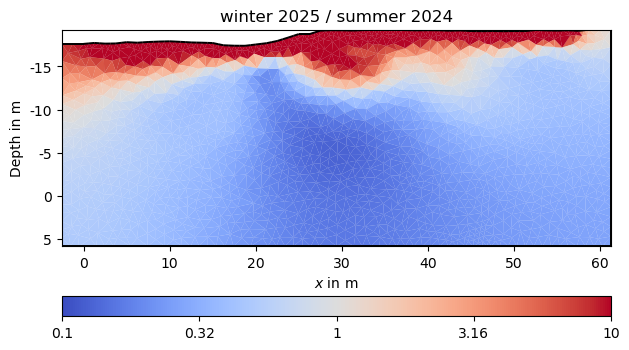

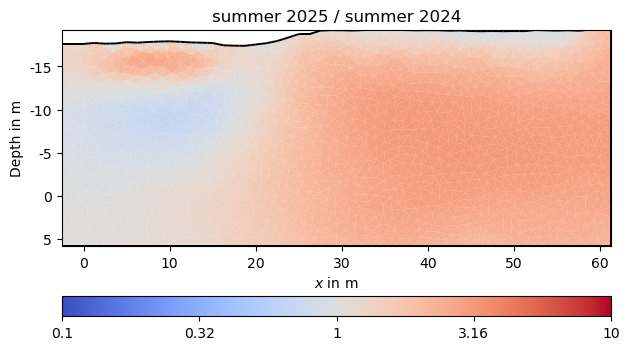

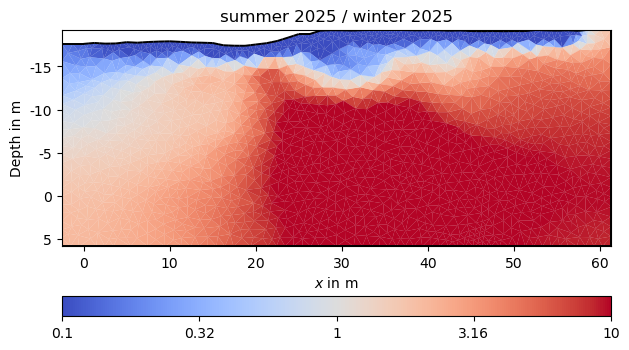

In [222]:
fak = 10
diffkw = dict(cMap="coolwarm", cMin=1/fak, cMax=fak, logScale=1)

ax, cb = pg.show(tl_ma.mgr.paraDomain,tl_ma.models[1]/tl_ma.models[0], **diffkw)
ax.set_title('winter 2025 / summer 2024')

ax, cb = pg.show(tl_ma.mgr.paraDomain,tl_ma.models[2]/tl_ma.models[0], **diffkw)
ax.set_title('summer 2025 / summer 2024')

ax, cb = pg.show(tl_ma.mgr.paraDomain,tl_ma.models[2]/tl_ma.models[1], **diffkw)
ax.set_title('summer 2025 / winter 2025')

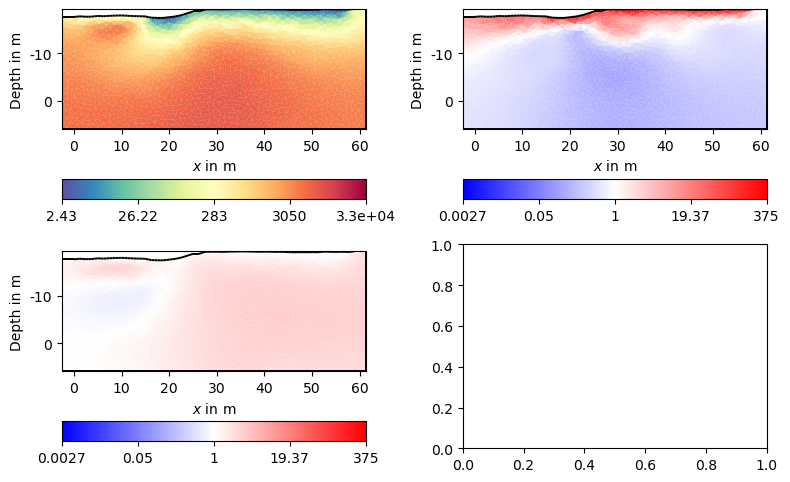

In [155]:
ax = tl_ma.showAllModels(ratio=True)

In [179]:
tl.generateModelPDF(cMin=10, cMax=10000)

<Figure size 800x500 with 0 Axes>

In [180]:
tl.generateRatioPDF(cMax=10, cMap="coolwarm")

<Figure size 800x500 with 0 Axes>

In [113]:
tl_ma = ert.TimelapseERT(v1[2:5], times=timepos[2:5], mesh=mesh)

11/09/25 - 08:19:04 - pyGIMLi - INFO - Found 2 regions.
11/09/25 - 08:19:04 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (1) set to background.
11/09/25 - 08:19:04 - pyGIMLi - INFO - Cache c:\Users\mealiy001\AppData\Local\anaconda3\envs\pgcore\Lib\site-packages\pygimli\physics\ert\ert.py:createGeometricFactors restored (0.0s x 5): C:\Users\mealiy001\AppData\Roaming\pygimli\Cache\1250432685805248165


In [164]:
tl_ma

Timelapse ERT data:
Data: Electrodes: 48 data: 565
3 time steps from 2024-08-16 10:30 to 2025-08-26 10:30

In [101]:
tl_ma.fullInversion(lam=20, verbose=True, zWeight=0.5)

10/09/25 - 22:47:15 - pyGIMLi - INFO - Found 2 regions.
10/09/25 - 22:47:15 - pyGIMLi - INFO - Region with smallest marker (1) set to background


10/09/25 - 22:47:15 - pyGIMLi - INFO - Creating forward mesh from region infos.
10/09/25 - 22:47:15 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
10/09/25 - 22:47:16 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 7649 Cells: 15032 Boundaries: 11406
10/09/25 - 22:47:17 - pyGIMLi - INFO - Starting inversion.


2794 model cells
Mesh: Nodes: 7649 Cells: 15032 Boundaries: 11406
fop: <pygimli.frameworks.timelapse.MultiFrameModelling object at 0x0000017A7F806250>
Data transformation: Identity transform
Model transformation: Logarithmic transform
min/max (data): 7.34/1.5e+04
min/max (error): 3%/1.0e+10%
min/max (start model): 208/208
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 18693.42
--------------------------------------------------------------------------------
inv.iter 1 ... chi² = 1805.37 (dPhi = 90.09%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  241.01 (dPhi = 84.03%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =  100.01 (dPhi = 50.49%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   73.50 (dPhi = 21.39%) lam: 20.0
----------------

8382 [15.611424702590126,...,567.9397188311699]

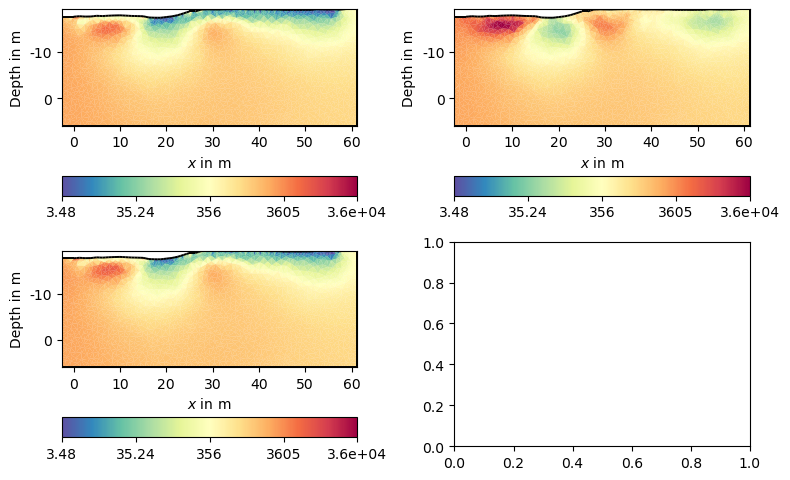

In [63]:
ax = tl_ma.showAllModels()

In [62]:
tl_ma.generateRatioPDF(cMap="coolwarm")

<Figure size 800x500 with 0 Axes>

In [61]:
tl_ma.generateModelPDF(cMin=10, cMax=10000)

<Figure size 800x500 with 0 Axes>

In [167]:
tl_ma.fullInversion(lam=20, verbose=True, zWeight=0.5, scalef=0.5)

10/09/25 - 17:12:38 - pyGIMLi - INFO - Found 2 regions.
10/09/25 - 17:12:38 - pyGIMLi - INFO - Region with smallest marker (1) set to background
10/09/25 - 17:12:38 - pyGIMLi - INFO - Creating forward mesh from region infos.
10/09/25 - 17:12:38 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
10/09/25 - 17:12:39 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 7649 Cells: 15032 Boundaries: 11406
10/09/25 - 17:12:40 - pyGIMLi - INFO - Starting inversion.


2794 model cells
Mesh: Nodes: 7649 Cells: 15032 Boundaries: 11406
fop: <pygimli.frameworks.timelapse.MultiFrameModelling object at 0x0000021521757290>
Data transformation: Identity transform
Model transformation: Logarithmic transform
min/max (data): 7.34/1.5e+04
min/max (error): 3%/1.0e+10%
min/max (start model): 208/208
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 18693.42
--------------------------------------------------------------------------------
inv.iter 1 ... chi² = 1985.27 (dPhi = 89.17%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  272.14 (dPhi = 85.27%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   72.28 (dPhi = 68.34%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   28.18 (dPhi = 45.55%) lam: 20.0
----------------

8382 [23.419737990474438,...,1172.4355419959616]

11/09/25 - 10:59:14 - pyGIMLi - INFO - Creating forward mesh from region infos.


11/09/25 - 10:59:14 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
11/09/25 - 10:59:15 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 7649 Cells: 15032 Boundaries: 11406


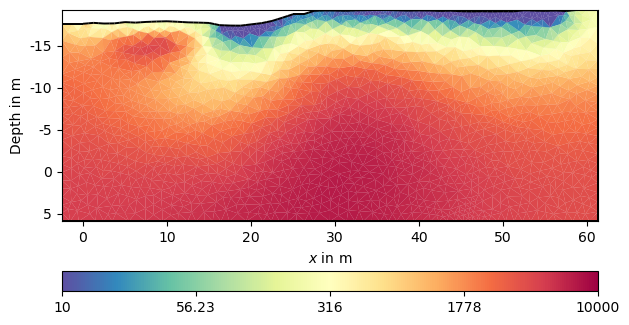

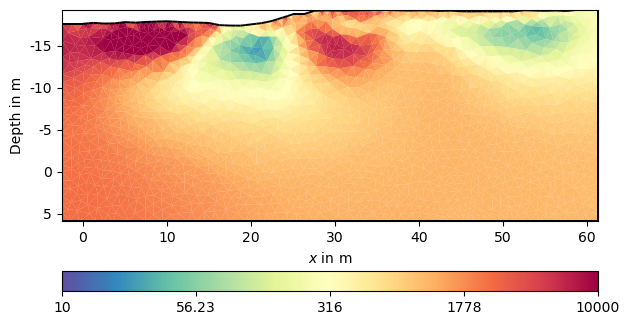

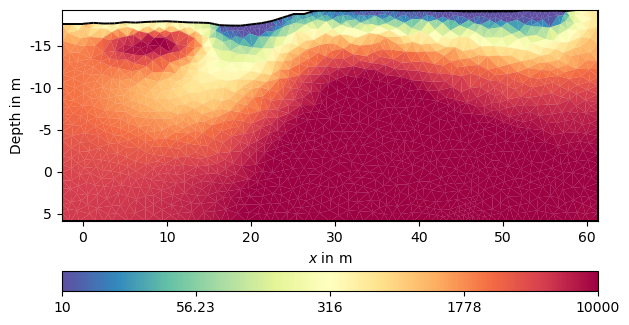

In [156]:
ax, cb = pg.show(tl.mgr.paraDomain, tl_ma.models[0], logScale=True, cMap='Spectral_r', cMin=10, cMax=10000)
ax, cb = pg.show(tl.mgr.paraDomain, tl_ma.models[1], logScale=True, cMap='Spectral_r', cMin=10, cMax=10000)
ax, cb = pg.show(tl.mgr.paraDomain, tl_ma.models[2], logScale=True, cMap='Spectral_r', cMin=10, cMax=10000)

Text(0.5, 1.0, 'Freezing period 2024/2025')

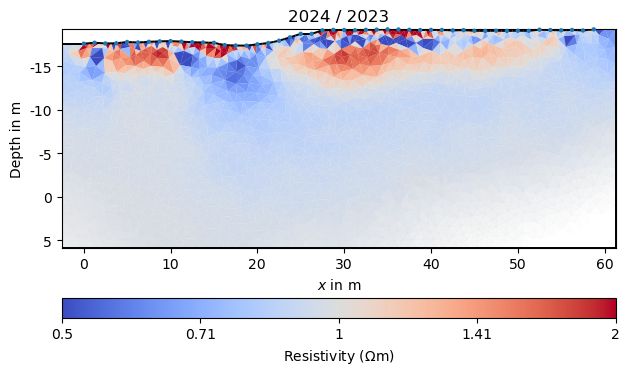

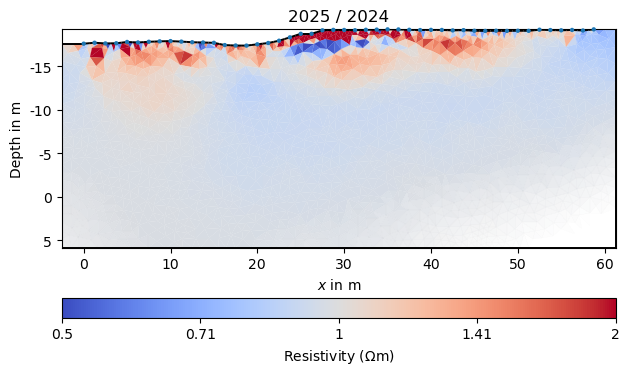

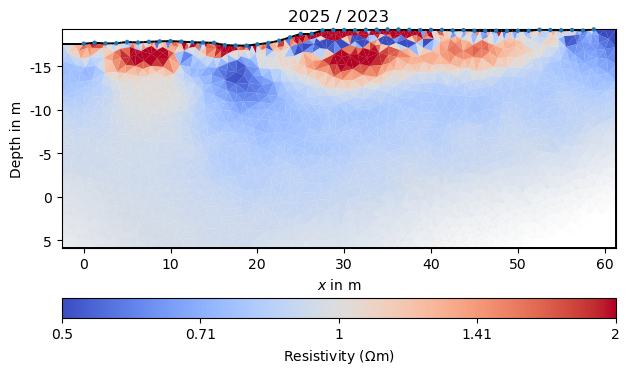

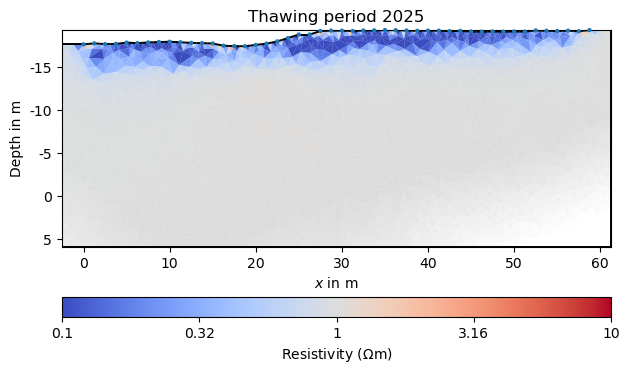

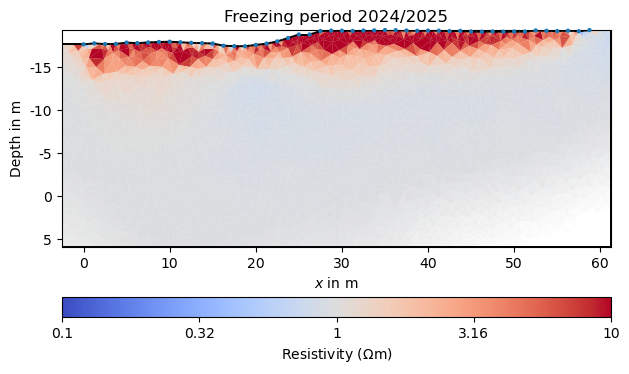

In [16]:
ax, cb = tl.mgr.showResult(tl.models[2]/tl.models[0], cMap='coolwarm', cMin=0.5, cMax=2)
ax.set_title('2024 / 2023')

ax, cb = tl.mgr.showResult(tl.models[4]/tl.models[2], cMap='coolwarm', cMin=0.5, cMax=2)
ax.set_title('2025 / 2024')

ax, cb = tl.mgr.showResult(tl.models[4]/tl.models[0], cMap='coolwarm', cMin=0.5, cMax=2)
ax.set_title('2025 / 2023')

ax, cb = tl.mgr.showResult(tl.models[4]/tl.models[3], cMap='coolwarm', cMin=0.1, cMax=10)
ax.set_title('Thawing period 2025')

ax, cb = tl.mgr.showResult(tl.models[3]/tl.models[2], cMap='coolwarm', cMin=0.1, cMax=10)
ax.set_title('Freezing period 2024/2025')

In [18]:
tl.fullInversion(lam=20, verbose=True, zWeight=0.5, scalef=2.0)

10/09/25 - 10:01:36 - pyGIMLi - INFO - Found 2 regions.
10/09/25 - 10:01:36 - pyGIMLi - INFO - Region with smallest marker (1) set to background
10/09/25 - 10:01:36 - pyGIMLi - INFO - Creating forward mesh from region infos.
10/09/25 - 10:01:36 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
10/09/25 - 10:01:36 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 7649 Cells: 15032 Boundaries: 11406
10/09/25 - 10:01:37 - pyGIMLi - INFO - Starting inversion.


2794 model cells
Mesh: Nodes: 7649 Cells: 15032 Boundaries: 11406
fop: <pygimli.frameworks.timelapse.MultiFrameModelling object at 0x00000213FE7D9990>
Data transformation: Identity transform
Model transformation: Logarithmic transform
min/max (data): 3.32/1.5e+04
min/max (error): 3%/1.0e+10%
min/max (start model): 126/126
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 3038.62
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  564.05 (dPhi = 80.70%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  232.42 (dPhi = 57.03%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =  156.51 (dPhi = 30.93%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   85.40 (dPhi = 37.71%) lam: 20.0
-----------------

13970 [36.68054419529547,...,5181.469892335559]

Text(0.5, 1.0, 'Freezing period 2024/2025')

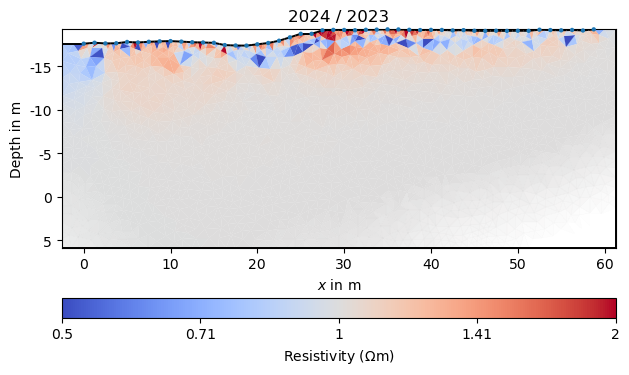

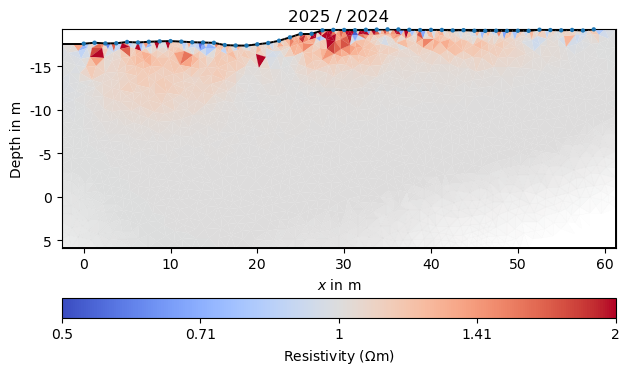

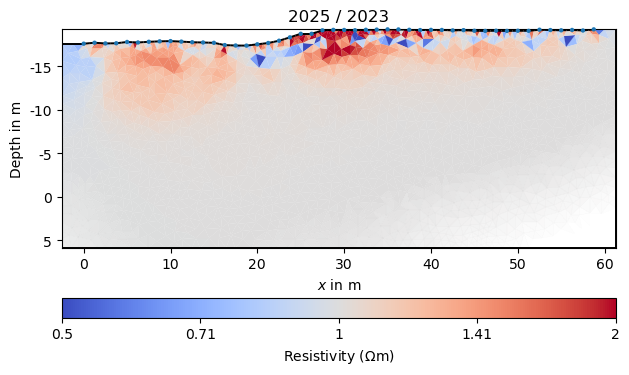

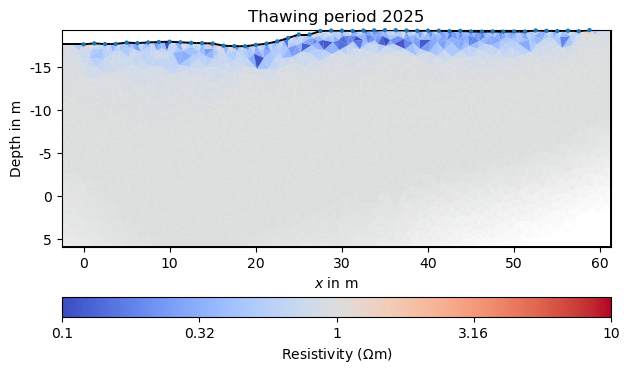

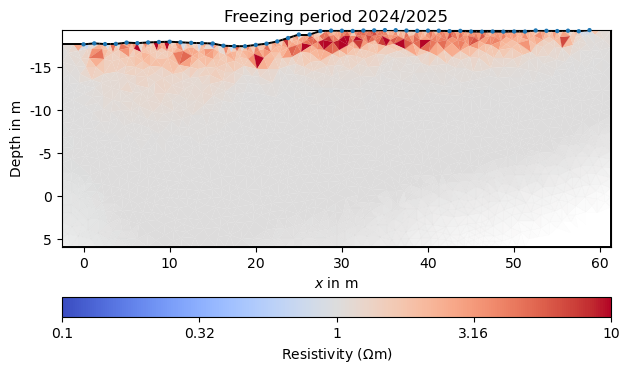

In [19]:
ax, cb = tl.mgr.showResult(tl.models[2]/tl.models[0], cMap='coolwarm', cMin=0.5, cMax=2)
ax.set_title('2024 / 2023')

ax, cb = tl.mgr.showResult(tl.models[4]/tl.models[2], cMap='coolwarm', cMin=0.5, cMax=2)
ax.set_title('2025 / 2024')

ax, cb = tl.mgr.showResult(tl.models[4]/tl.models[0], cMap='coolwarm', cMin=0.5, cMax=2)
ax.set_title('2025 / 2023')

ax, cb = tl.mgr.showResult(tl.models[4]/tl.models[3], cMap='coolwarm', cMin=0.1, cMax=10)
ax.set_title('Thawing period 2025')

ax, cb = tl.mgr.showResult(tl.models[3]/tl.models[2], cMap='coolwarm', cMin=0.1, cMax=10)
ax.set_title('Freezing period 2024/2025')

In [20]:
tl.fullInversion(lam=40, verbose=True, zWeight=0.5)

10/09/25 - 10:55:55 - pyGIMLi - INFO - Found 2 regions.
10/09/25 - 10:55:55 - pyGIMLi - INFO - Region with smallest marker (1) set to background
10/09/25 - 10:55:55 - pyGIMLi - INFO - Creating forward mesh from region infos.
10/09/25 - 10:55:55 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
10/09/25 - 10:55:55 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 7649 Cells: 15032 Boundaries: 11406
10/09/25 - 10:55:57 - pyGIMLi - INFO - Starting inversion.


2794 model cells
Mesh: Nodes: 7649 Cells: 15032 Boundaries: 11406
fop: <pygimli.frameworks.timelapse.MultiFrameModelling object at 0x00000213805B1CB0>
Data transformation: Identity transform
Model transformation: Logarithmic transform
min/max (data): 3.32/1.5e+04
min/max (error): 3%/1.0e+10%
min/max (start model): 126/126
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 3038.62
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  509.89 (dPhi = 82.42%) lam: 40.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  152.03 (dPhi = 66.54%) lam: 40.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =  105.66 (dPhi = 27.73%) lam: 40.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   75.62 (dPhi = 21.85%) lam: 40.0
-----------------

13970 [30.61283086993406,...,1380.3434891809234]

Text(0.5, 1.0, 'Freezing period 2024/2025')

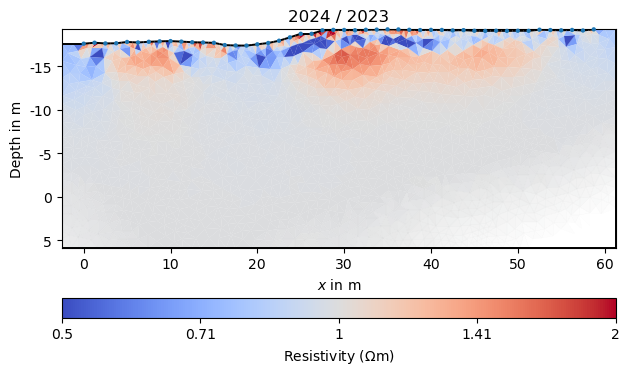

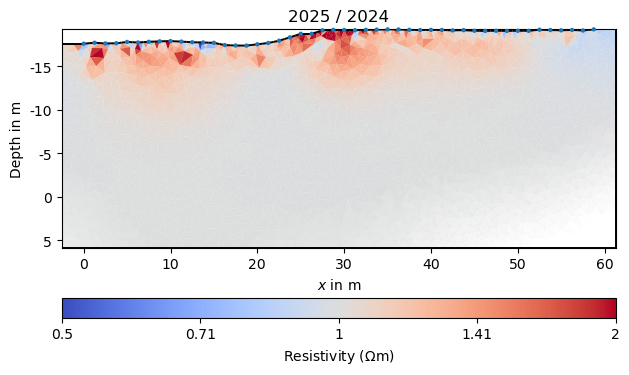

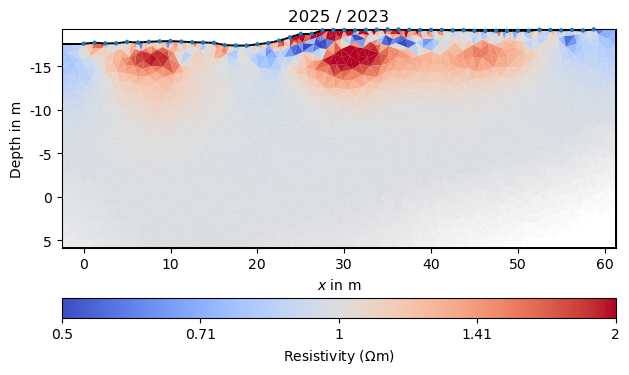

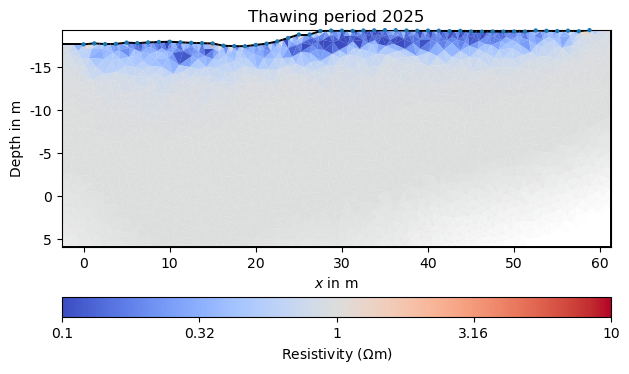

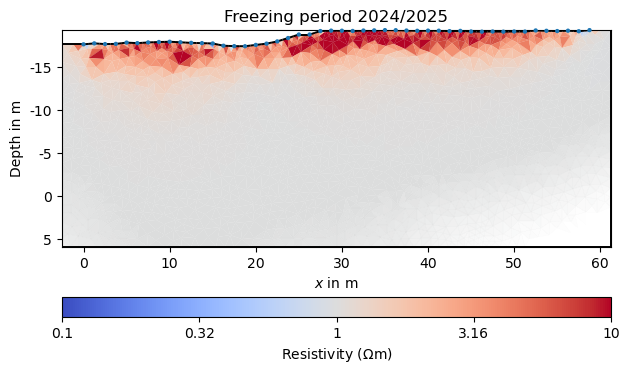

In [21]:
ax, cb = tl.mgr.showResult(tl.models[2]/tl.models[0], cMap='coolwarm', cMin=0.5, cMax=2)
ax.set_title('2024 / 2023')

ax, cb = tl.mgr.showResult(tl.models[4]/tl.models[2], cMap='coolwarm', cMin=0.5, cMax=2)
ax.set_title('2025 / 2024')

ax, cb = tl.mgr.showResult(tl.models[4]/tl.models[0], cMap='coolwarm', cMin=0.5, cMax=2)
ax.set_title('2025 / 2023')

ax, cb = tl.mgr.showResult(tl.models[4]/tl.models[3], cMap='coolwarm', cMin=0.1, cMax=10)
ax.set_title('Thawing period 2025')

ax, cb = tl.mgr.showResult(tl.models[3]/tl.models[2], cMap='coolwarm', cMin=0.1, cMax=10)
ax.set_title('Freezing period 2024/2025')

In [232]:
ax, cb = tl.mgr.showResult(tl.models[2]/tl.models[0], cMap='coolwarm', **diffkw)
ax.set_title('2024 / 2023')

ax, cb = tl.mgr.showResult(tl.models[4]/tl.models[2], cMap='coolwarm', cMin=0.5, cMax=2)
ax.set_title('2025 / 2024')

ax, cb = tl.mgr.showResult(tl.models[4]/tl.models[0], cMap='coolwarm', cMin=0.5, cMax=2)
ax.set_title('2025 / 2023')

ax, cb = tl.mgr.showResult(tl.models[4]/tl.models[3], cMap='coolwarm', cMin=0.1, cMax=10)
ax.set_title('Thawing period 2025')

ax, cb = tl.mgr.showResult(tl.models[3]/tl.models[2], cMap='coolwarm', cMin=0.1, cMax=10)
ax.set_title('Freezing period 2024/2025')

TypeError: pygimli.frameworks.methodManager.MethodManager.showResult() got multiple values for keyword argument 'cMap'

In [88]:
tl.models

[]

Difference inversion

11/09/25 - 19:21:23 - pyGIMLi - INFO - Found 2 regions.
11/09/25 - 19:21:23 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (1) set to background.
11/09/25 - 19:21:23 - pyGIMLi - INFO - Creating forward mesh from region infos.
11/09/25 - 19:21:23 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
11/09/25 - 19:21:23 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 12622 Cells: 24972 Boundaries: 18864
11/09/25 - 19:21:23 - pyGIMLi - INFO - Use median(data values)=122.73248246464082
11/09/25 - 19:21:23 - pyGIMLi - INFO - Created startmodel from forward operator:5197, min/max=122.732482/122.732482
11/09/25 - 19:21:23 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x0000017B5DD84B30>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation: Logarithmic transform
min/max (data): 9.1/1778
min/max (error): 2%/5.93%
min/max (start model): 123/123
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 2443.32
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  280.91 (dPhi = 88.25%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  140.28 (dPhi = 49.63%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   21.95 (dPhi = 80.70%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    3.69 (dPhi = 63.76%) lam: 20.0
-----------------------------------------------------

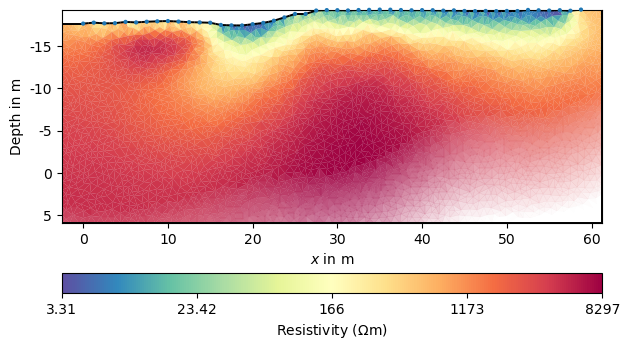

In [228]:
mgr = ert.Manager(v1[0])
mgr.invert(mesh=mesh, verbose=True)
ax, cb = mgr.showResult()

11/09/25 - 08:48:07 - pyGIMLi - INFO - Found 2 regions.
11/09/25 - 08:48:07 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (1) set to background.
11/09/25 - 08:48:07 - pyGIMLi - INFO - Creating forward mesh from region infos.
11/09/25 - 08:48:07 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
11/09/25 - 08:48:08 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 7649 Cells: 15032 Boundaries: 11406
11/09/25 - 08:48:08 - pyGIMLi - INFO - Use median(data values)=123.47336532976955
11/09/25 - 08:48:08 - pyGIMLi - INFO - Created startmodel from forward operator:2794, min/max=123.473365/123.473365
11/09/25 - 08:48:08 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x0000017AD109F830>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation: Logarithmic transform
min/max (data): 8.42/1723
min/max (error): 5%/5.51%
min/max (start model): 123/123
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  561.94
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   54.25 (dPhi = 89.79%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   26.75 (dPhi = 47.81%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    2.30 (dPhi = 75.68%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    2.16 (dPhi = 6.15%) lam: 20.0
-----------------------------------------------------

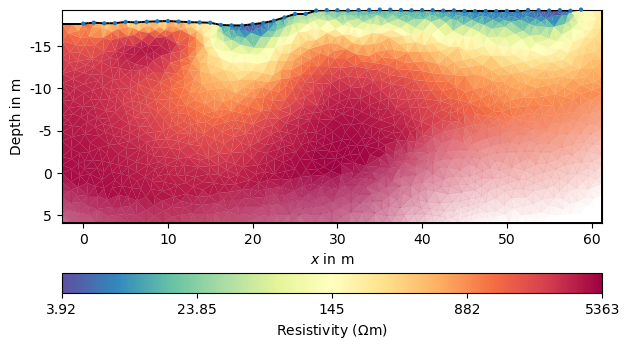

In [ ]:
mgrS = ert.Manager(v1[4])
mgrS.invert(mesh=mesh, verbose=True)
ax, cb = mgrS.showResult()

11/09/25 - 08:54:07 - pyGIMLi - INFO - Found 2 regions.
11/09/25 - 08:54:07 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (1) set to background.
11/09/25 - 08:54:07 - pyGIMLi - INFO - Creating forward mesh from region infos.
11/09/25 - 08:54:08 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
11/09/25 - 08:54:08 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 7649 Cells: 15032 Boundaries: 11406
11/09/25 - 08:54:08 - pyGIMLi - INFO - Use median(data values)=684.1413988154676
11/09/25 - 08:54:08 - pyGIMLi - INFO - Created startmodel from forward operator:2794, min/max=684.141399/684.141399
11/09/25 - 08:54:08 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x0000017AD37AFDD0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation: Logarithmic transform
min/max (data): 77.25/1.5e+04
min/max (error): 5%/7.47%
min/max (start model): 684/684
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  427.43
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   38.88 (dPhi = 90.13%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    7.60 (dPhi = 74.44%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    2.79 (dPhi = 42.62%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    2.57 (dPhi = 2.20%) lam: 20.0
-------------------------------------------------

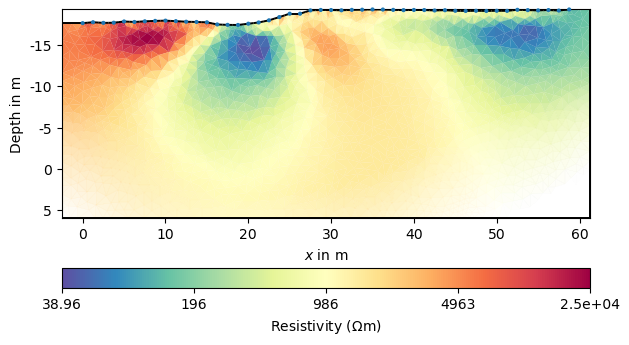

In [123]:
mgrW = ert.Manager(v1[3])
mgrW.invert(mesh=mesh, verbose=True)
ax, cb = mgrW.showResult()

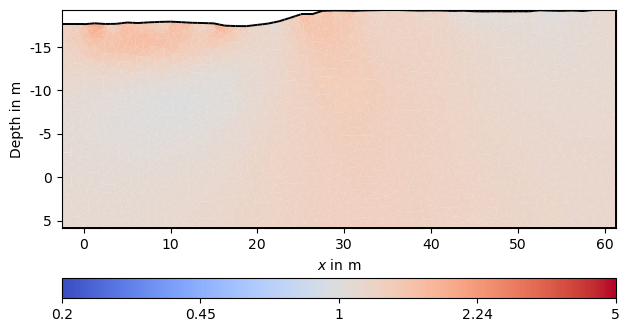

In [124]:
fak = 5
diffkw = dict(cMap="coolwarm", cMin=1/fak, cMax=fak, logScale=1)
ax, cb = pg.show(mgr.paraDomain, mgrS.model/mgr.model, **diffkw)

10/09/25 - 13:52:21 - pyGIMLi - INFO - Found 2 regions.
10/09/25 - 13:52:21 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (1) set to background.
10/09/25 - 13:52:21 - pyGIMLi - INFO - Creating forward mesh from region infos.
10/09/25 - 13:52:22 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
10/09/25 - 13:52:22 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 7649 Cells: 15032 Boundaries: 11406
10/09/25 - 13:52:22 - pyGIMLi - INFO - Use median(data values)=123.47336532976955
10/09/25 - 13:52:22 - pyGIMLi - INFO - Created startmodel from forward operator:2794, min/max=123.473365/123.473365
10/09/25 - 13:52:22 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x00000213811D7240>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation: Logarithmic transform
min/max (data): 8.42/1723
min/max (error): 2%/2.51%
min/max (start model): 123/123
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 3418.34
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  491.72 (dPhi = 85.38%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  282.62 (dPhi = 42.34%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   67.54 (dPhi = 74.35%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    5.43 (dPhi = 81.82%) lam: 20.0
----------------------------------------------------

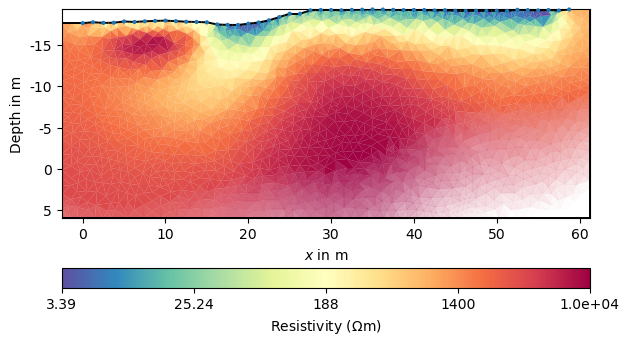

In [25]:
mgrY = ert.Manager(v1[4])
mgrY.invert(mesh=mesh, verbose=True)
ax, cb = mgrY.showResult()

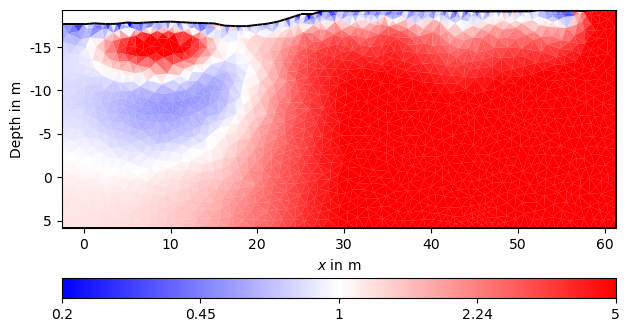

In [26]:
fak = 5
diffkw = dict(cMap="bwr", cMin=1/fak, cMax=fak, logScale=1)
ax, cb = pg.show(mgr.paraDomain, mgrY.model/mgr.model, **diffkw)

11/09/25 - 09:16:09 - pyGIMLi - INFO - Found 2 regions.
11/09/25 - 09:16:09 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (1) set to background.
11/09/25 - 09:16:09 - pyGIMLi - INFO - Creating forward mesh from region infos.
11/09/25 - 09:16:09 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
11/09/25 - 09:16:10 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 7649 Cells: 15032 Boundaries: 11406
11/09/25 - 09:16:10 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x0000017AD109F830>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation: Logarithmic transform
min/max (data): 8.42/1723
min/max (error): 5%/5.51%
min/max (start model): 3.73/4328
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   29.63
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    2.04 (dPhi = 80.82%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    1.95 (dPhi = 1.69%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    1.94 (dPhi = 0.07%) lam: 20.0
################################################################################
#                Abort criterion reached: dPhi = 0.07 (< 2.0%)                 #
###########################

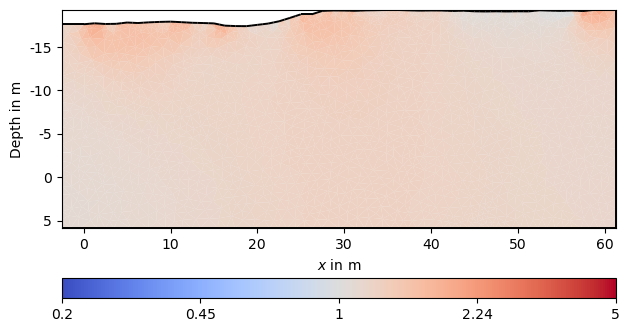

In [125]:

mgrS.invert(mesh=mesh, startModel=mgr.model, verbose=True)
ax, cb = pg.show(mgr.paraDomain, mgrS.model/mgr.model, **diffkw)

11/09/25 - 09:20:39 - pyGIMLi - INFO - Found 2 regions.
11/09/25 - 09:20:39 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (1) set to background.
11/09/25 - 09:20:39 - pyGIMLi - INFO - Creating forward mesh from region infos.
11/09/25 - 09:20:39 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
11/09/25 - 09:20:39 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 7649 Cells: 15032 Boundaries: 11406
11/09/25 - 09:20:40 - pyGIMLi - INFO - Starting inversion.
11/09/25 - 09:20:40 - pyGIMLi - INFO - Setting starting model as reference!


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x0000017AD109F830>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation: Logarithmic transform
min/max (data): 8.42/1723
min/max (error): 5%/5.51%
min/max (start model): 3.73/4328
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   29.63
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    1.02 (dPhi = 95.08%) lam: 50.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    1.01 (dPhi = 5.45%) lam: 50.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    1.02 (dPhi = 0.48%) lam: 50.0
################################################################################
#                Abort criterion reached: dPhi = 0.48 (< 2.0%)                 #
###########################

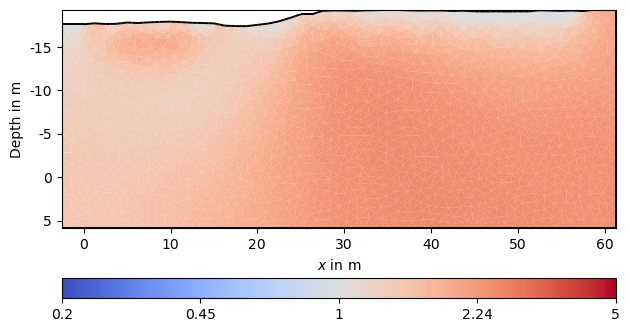

In [126]:
mgrS.invert(mesh=mesh, startModel=mgr.model, isReference=True, lam=50, verbose=True)
ax, cb = pg.show(mgr.paraDomain, mgrS.model/mgr.model, **diffkw)

10/09/25 - 14:03:19 - pyGIMLi - INFO - Found 2 regions.
10/09/25 - 14:03:19 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (1) set to background.
10/09/25 - 14:03:19 - pyGIMLi - INFO - Creating forward mesh from region infos.
10/09/25 - 14:03:19 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
10/09/25 - 14:03:19 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 7649 Cells: 15032 Boundaries: 11406
10/09/25 - 14:03:19 - pyGIMLi - INFO - Starting inversion.
10/09/25 - 14:03:19 - pyGIMLi - INFO - Setting starting model as reference!


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x00000213811D7240>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation: Logarithmic transform
min/max (data): 8.42/1723
min/max (error): 2%/2.51%
min/max (start model): 5.41/3245
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =   93.80
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =   33.75 (dPhi = 62.05%) lam: 50.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    5.79 (dPhi = 67.84%) lam: 50.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    4.83 (dPhi = 14.04%) lam: 50.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    4.49 (dPhi = 6.53%) lam: 50.0
---------------------------------------------------

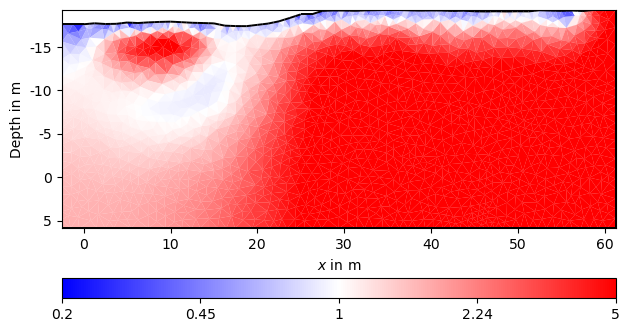

In [29]:
mgrY.invert(mesh=mesh, startModel=mgr.model, isReference=True, lam=50, verbose=True)
ax, cb = pg.show(mgr.paraDomain, mgrY.model/mgr.model, **diffkw)

11/09/25 - 19:40:49 - pyGIMLi - INFO - Found 2 regions.
11/09/25 - 19:40:49 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (1) set to background.
11/09/25 - 19:40:49 - pyGIMLi - INFO - Creating forward mesh from region infos.
11/09/25 - 19:40:50 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
11/09/25 - 19:40:50 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 12622 Cells: 24972 Boundaries: 18864
11/09/25 - 19:40:51 - pyGIMLi - INFO - Starting inversion.
11/09/25 - 19:40:51 - pyGIMLi - INFO - Setting starting model as reference!


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x0000017B5C7B69D0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation: Logarithmic transform
min/max (data): 7.66/1237
min/max (error): 2%/2.7%
min/max (start model): 3.31/8297
--------------------------------------------------------------------------------
inv.iter 0 ... chi² =  139.97
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =    5.65 (dPhi = 95.57%) lam: 50.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =    4.18 (dPhi = 23.05%) lam: 50.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    3.90 (dPhi = 5.22%) lam: 50.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    3.89 (dPhi = 0.13%) lam: 50.0
#####################################################

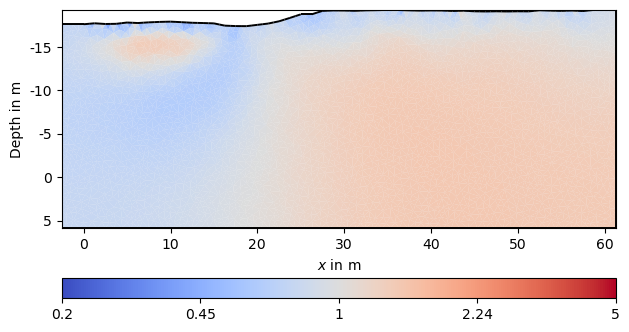

In [229]:
data = v1[2]
dataD = data.copy()
dataD["rhoa"] = data["rhoa"] * mgr.inv.response / mgr.inv.dataVals
mgrD = ert.Manager(dataD)
mgrD.invert(mesh=mesh, startModel=mgr.model, isReference=True, lam=50, verbose=True)
ax, cb = pg.show(mgrD.paraDomain, mgrD.model/mgr.model, **diffkw)

11/09/25 - 19:47:35 - pyGIMLi - INFO - Found 2 regions.
11/09/25 - 19:47:35 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (1) set to background.
11/09/25 - 19:47:35 - pyGIMLi - INFO - Creating forward mesh from region infos.
11/09/25 - 19:47:35 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
11/09/25 - 19:47:35 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 12622 Cells: 24972 Boundaries: 18864
11/09/25 - 19:47:36 - pyGIMLi - INFO - Starting inversion.
11/09/25 - 19:47:36 - pyGIMLi - INFO - Setting starting model as reference!


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x0000017B0CC4CD10>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation: Logarithmic transform
min/max (data): 570/570
min/max (error): 2%/2.51%
min/max (start model): 3.31/8297
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 8467.93
--------------------------------------------------------------------------------
inv.iter 1 ... chi² = 7420.35 (dPhi = 12.34%) lam: 50.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² = 5120.08 (dPhi = 30.94%) lam: 50.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =  202.15 (dPhi = 95.76%) lam: 50.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    1.62 (dPhi = 93.37%) lam: 50.0
----------------------------------------------------

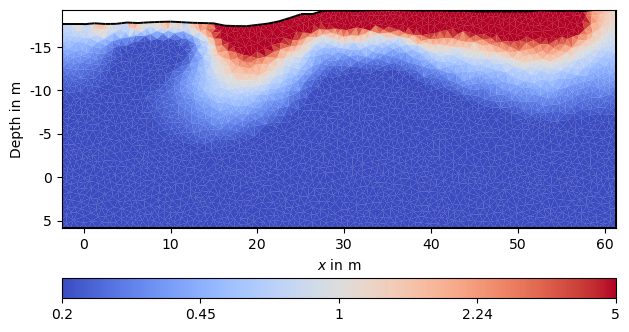

In [230]:
data = v1[4]
dataD1 = data.copy()
valid = data["valid"]   # or use data["valid"] if available
dataD1["rhoa"] = data["rhoa"][valid] * mgrW.inv.response[valid] / mgrW.inv.dataVals[valid]
mgrD1 = ert.Manager(dataD1)
mgrD1.invert(mesh=mesh, startModel=mgr.model, isReference=True, lam=50, verbose=True)
ax, cb = pg.show(mgrD1.paraDomain, mgrD1.model/mgr.model, **diffkw)

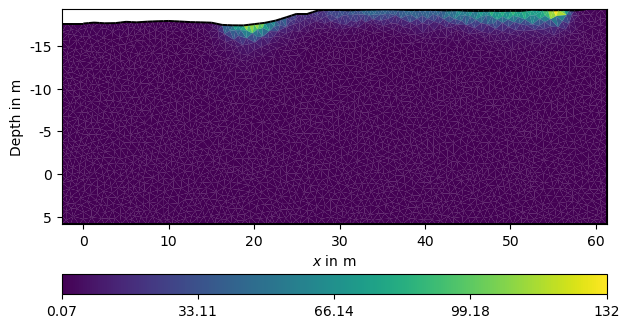

In [231]:
ax, cb = pg.show(mgrD1.paraDomain, mgrD1.model/mgr.model)

10/09/25 - 14:57:49 - pyGIMLi - INFO - Found 2 regions.
10/09/25 - 14:57:49 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (1) set to background.
10/09/25 - 14:57:49 - pyGIMLi - INFO - Creating forward mesh from region infos.
10/09/25 - 14:57:49 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
10/09/25 - 14:57:50 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 7649 Cells: 15032 Boundaries: 11406
10/09/25 - 14:57:50 - pyGIMLi - INFO - Starting inversion.
10/09/25 - 14:57:50 - pyGIMLi - INFO - Setting starting model as reference!


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x0000021380849CB0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation: Logarithmic transform
min/max (data): 7301/7301
min/max (error): 2%/4.47%
min/max (start model): 3.15/7839
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 46137.67
--------------------------------------------------------------------------------
inv.iter 1 ... chi² = 36097.99 (dPhi = 21.73%) lam: 50.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  307.76 (dPhi = 99.10%) lam: 50.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   19.17 (dPhi = 89.57%) lam: 50.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    6.47 (dPhi = 39.52%) lam: 50.0
------------------------------------------------

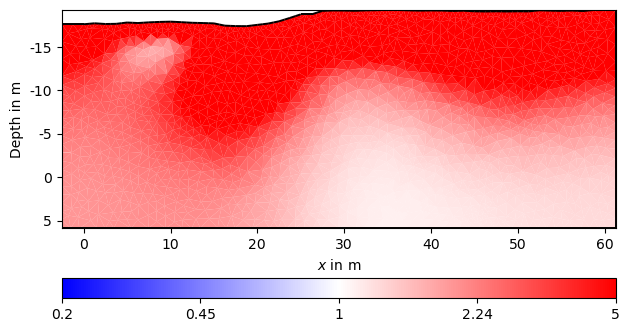

In [ ]:
data = v1[3]
dataW = data.copy()
valid = data["valid"]   # or use data["valid"] if available
dataW["rhoa"] = data["rhoa"][valid] * mgr.inv.response[valid] / mgr.inv.dataVals[valid]
#dataW["rhoa"] = data["rhoa"] * mgr.inv.response / mgr.inv.dataVals
mgrW = ert.Manager(dataW)
mgrW.invert(mesh=mesh, startModel=mgr.model, isReference=True, lam=50, verbose=True)
ax, cb = pg.show(mgrW.paraDomain, mgrW.model/mgr.model, **diffkw)

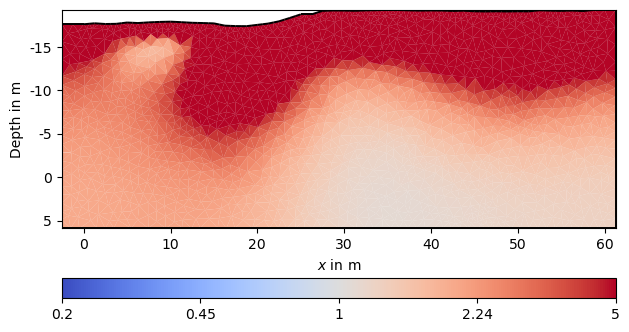

In [83]:
ax, cb = pg.show(mgrW.paraDomain, mgrW.model/mgr.model, **diffkw)

10/09/25 - 15:11:37 - pyGIMLi - INFO - Found 2 regions.
10/09/25 - 15:11:37 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (1) set to background.
10/09/25 - 15:11:37 - pyGIMLi - INFO - Creating forward mesh from region infos.
10/09/25 - 15:11:38 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
10/09/25 - 15:11:38 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 7649 Cells: 15032 Boundaries: 11406
10/09/25 - 15:11:38 - pyGIMLi - INFO - Use median(data values)=684.1413988154579
10/09/25 - 15:11:38 - pyGIMLi - INFO - Created startmodel from forward operator:2794, min/max=684.141399/684.141399
10/09/25 - 15:11:38 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x000002138266E9D0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation: Logarithmic transform
min/max (data): 77.25/1.5e+04
min/max (error): 2%/4.47%
min/max (start model): 684/684
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 2615.06
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  419.24 (dPhi = 83.63%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  139.43 (dPhi = 66.12%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   13.22 (dPhi = 86.67%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    7.36 (dPhi = 30.02%) lam: 20.0
------------------------------------------------

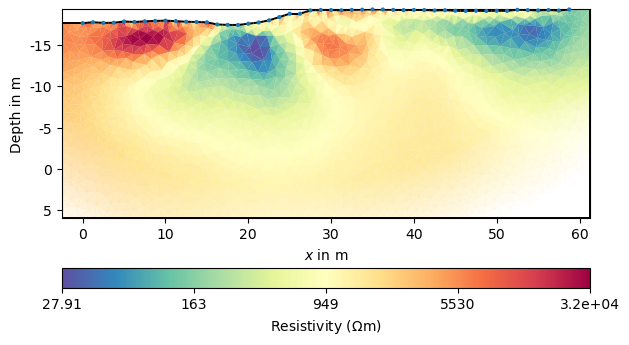

In [84]:
mgrY = ert.Manager(v1[3])
mgrY.invert(mesh=mesh, verbose=True)
ax, cb = mgrY.showResult()

10/09/25 - 15:17:12 - pyGIMLi - INFO - Found 2 regions.
10/09/25 - 15:17:12 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (1) set to background.
10/09/25 - 15:17:12 - pyGIMLi - INFO - Creating forward mesh from region infos.
10/09/25 - 15:17:12 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
10/09/25 - 15:17:12 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 7649 Cells: 15032 Boundaries: 11406
10/09/25 - 15:17:12 - pyGIMLi - INFO - Starting inversion.
10/09/25 - 15:17:12 - pyGIMLi - INFO - Setting starting model as reference!


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x00000213C1E3C090>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation: Logarithmic transform
min/max (data): 535/535
min/max (error): 2%/2.51%
min/max (start model): 27.91/3.2e+04
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 2841.78
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  312.48 (dPhi = 88.76%) lam: 50.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   20.84 (dPhi = 91.24%) lam: 50.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =    4.65 (dPhi = 53.91%) lam: 50.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    2.53 (dPhi = 15.54%) lam: 50.0
------------------------------------------------

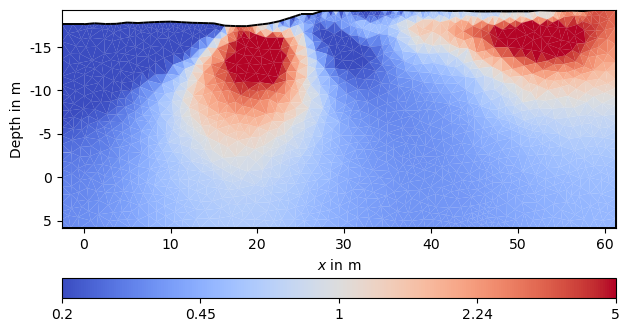

In [85]:
data = v1[4]
dataLS = data.copy()
valid = data["valid"]   # or use data["valid"] if available
dataLS["rhoa"] = data["rhoa"][valid] * mgrY.inv.response[valid] / mgrY.inv.dataVals[valid]
#dataW["rhoa"] = data["rhoa"] * mgr.inv.response / mgr.inv.dataVals
mgrLS = ert.Manager(dataLS)
mgrLS.invert(mesh=mesh, startModel=mgrY.model, isReference=True, lam=50, verbose=True)
ax, cb = pg.show(mgrLS.paraDomain, mgrLS.model/mgrY.model, **diffkw)

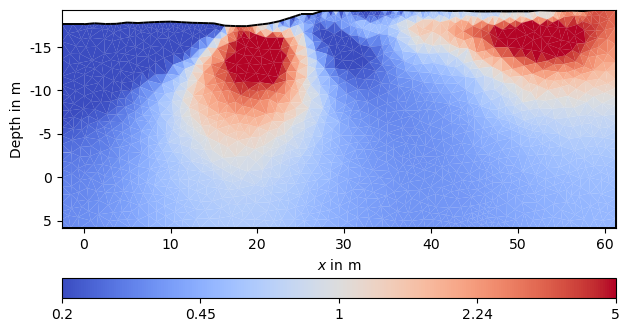

In [86]:
ax, cb = pg.show(mgrY.paraDomain, mgrLS.model/mgrY.model, **diffkw)

In [ ]:
mgr = ert.ERTManager(v1[0], verbose=True)
baseline= mgr.invert(v1[0], mesh=mesh, lam=20, zWeight=0.5)
timestep1= mgr.invert (v1[2], startModel=baseline, isReference=True)
ratio = timestep1 / baseline * 100 - 100
mgr.showResult(ratio)

In [40]:
cell_average = tl.models.mean(axis=0)
all_diffs = [tl.models[i] - cell_average for i in range(len(tl.models))]
vmax = np.nanmax([np.abs(diff).max() for diff in all_diffs])
vmin = np.nanmin([np.abs(diff).min() for diff in all_diffs])

with PdfPages('timelapse_diff_vs_cellaverage_abs.pdf') as pdf:
    for i in range(len(tl.models)):
        fig, ax = plt.subplots(figsize=(8, 4))
        diff = tl.models[i] - cell_average
        tl.mgr.showResult(diff, ax=ax, cMin=-vmax, cMax=vmax)
        ax.set_title(f"{timeposs[i]} - cellAverage", fontsize=10)
        fig.tight_layout()
        fig.canvas.draw()
        pdf.savefig(fig)
        plt.close(fig)

In [42]:
with PdfPages('timelapse_diff_vs_cellaverage_rel.pdf') as pdf:
    for i in range(len(tl.models)):
        fig, ax = plt.subplots(figsize=(8, 4))
        tl.mgr.showResult(tl.models[i]/cell_average, ax=ax, cMap='bwr', cMin=0.5, cMax=2)
        ax.set_title(f"{timeposs[i]} / cellAverage", fontsize=10)
        fig.tight_layout()
        fig.canvas.draw()
        pdf.savefig(fig)
        plt.close(fig)

23/07/25 - 11:26:24 - pyGIMLi - INFO - Use median(data values)=126.38123549962083
23/07/25 - 11:26:24 - pyGIMLi - INFO - Created startmodel from forward operator:1641, min/max=126.381235/126.381235
23/07/25 - 11:26:24 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x000002600ECC22F0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 13.74/436
min/max (error): 2%/2.88%
min/max (start model): 126/126
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1675.72
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  265.21 (dPhi = 81.19%) lam: 1000.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   33.55 (dPhi = 64.61%) lam: 1000.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =   38.09 (dPhi = 5.88%) lam: 1000.0
--------------------------------------------------------------------------------
inv.iter 4 ... 

23/07/25 - 11:27:07 - pyGIMLi - INFO - Use median(data values)=126.38123549962083
23/07/25 - 11:27:07 - pyGIMLi - INFO - Created startmodel from forward operator:1641, min/max=126.381235/126.381235
23/07/25 - 11:27:07 - pyGIMLi - INFO - Starting inversion.


chi² =   28.96 (dPhi = 1.55%) lam: 1000.0
################################################################################
#                Abort criterion reached: dPhi = 1.55 (< 2.0%)                 #
################################################################################
fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x000002600ECC22F0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 13.74/436
min/max (error): 2%/2.88%
min/max (start model): 126/126
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1675.72
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  265.19 (dPhi = 81.52%) lam: 853.2
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   33.31 (dPhi = 66.8

23/07/25 - 11:27:52 - pyGIMLi - INFO - Use median(data values)=126.38123549962083
23/07/25 - 11:27:52 - pyGIMLi - INFO - Created startmodel from forward operator:1641, min/max=126.381235/126.381235
23/07/25 - 11:27:52 - pyGIMLi - INFO - Starting inversion.


chi² =   33.16 (dPhi = 9.08%) lam: 853.2
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   27.40 (dPhi = 1.14%) lam: 853.2
################################################################################
#                Abort criterion reached: dPhi = 1.14 (< 2.0%)                 #
################################################################################
fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x000002600ECC22F0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 13.74/436
min/max (error): 2%/2.88%
min/max (start model): 126/126
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1675.72
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  265.52 (dPhi = 81.79%

23/07/25 - 11:28:36 - pyGIMLi - INFO - Use median(data values)=126.38123549962083
23/07/25 - 11:28:36 - pyGIMLi - INFO - Created startmodel from forward operator:1641, min/max=126.381235/126.381235
23/07/25 - 11:28:36 - pyGIMLi - INFO - Starting inversion.


chi² =   25.91 (dPhi = 0.41%) lam: 727.9
################################################################################
#                Abort criterion reached: dPhi = 0.41 (< 2.0%)                 #
################################################################################
fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x000002600ECC22F0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 13.74/436
min/max (error): 2%/2.88%
min/max (start model): 126/126
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1675.72
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  266.30 (dPhi = 82.00%) lam: 621.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   35.58 (dPhi = 70.43

23/07/25 - 11:29:21 - pyGIMLi - INFO - Use median(data values)=126.38123549962083
23/07/25 - 11:29:21 - pyGIMLi - INFO - Created startmodel from forward operator:1641, min/max=126.381235/126.381235
23/07/25 - 11:29:21 - pyGIMLi - INFO - Starting inversion.


chi² =   22.33 (dPhi = 0.07%) lam: 621.0
################################################################################
#                Abort criterion reached: dPhi = 0.07 (< 2.0%)                 #
################################################################################
fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x000002600ECC22F0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 13.74/436
min/max (error): 2%/2.88%
min/max (start model): 126/126
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1675.72
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  267.63 (dPhi = 82.15%) lam: 529.8
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   37.90 (dPhi = 71.68

23/07/25 - 11:30:01 - pyGIMLi - INFO - Use median(data values)=126.38123549962083
23/07/25 - 11:30:01 - pyGIMLi - INFO - Created startmodel from forward operator:1641, min/max=126.381235/126.381235
23/07/25 - 11:30:01 - pyGIMLi - INFO - Starting inversion.


chi² =   18.66 (dPhi = 0.04%) lam: 529.8
################################################################################
#                Abort criterion reached: dPhi = 0.04 (< 2.0%)                 #
################################################################################
fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x000002600ECC22F0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 13.74/436
min/max (error): 2%/2.88%
min/max (start model): 126/126
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1675.72
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  269.59 (dPhi = 82.23%) lam: 452.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   41.04 (dPhi = 72.54

23/07/25 - 11:30:52 - pyGIMLi - INFO - Use median(data values)=126.38123549962083
23/07/25 - 11:30:52 - pyGIMLi - INFO - Created startmodel from forward operator:1641, min/max=126.381235/126.381235
23/07/25 - 11:30:52 - pyGIMLi - INFO - Starting inversion.


chi² =   15.55 (dPhi = 0.01%) lam: 452.0
################################################################################
#                Abort criterion reached: dPhi = 0.01 (< 2.0%)                 #
################################################################################
fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x000002600ECC22F0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 13.74/436
min/max (error): 2%/2.88%
min/max (start model): 126/126
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1675.72
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  272.22 (dPhi = 82.24%) lam: 385.7
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   44.56 (dPhi = 73.14

23/07/25 - 11:31:44 - pyGIMLi - INFO - Use median(data values)=126.38123549962083
23/07/25 - 11:31:44 - pyGIMLi - INFO - Created startmodel from forward operator:1641, min/max=126.381235/126.381235
23/07/25 - 11:31:44 - pyGIMLi - INFO - Starting inversion.


chi² =   13.09 (dPhi = 36.44%) lam: 385.7
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   13.37 (dPhi = 0.05%) lam: 385.7
################################################################################
#                Abort criterion reached: dPhi = 0.05 (< 2.0%)                 #
################################################################################
fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x000002600ECC22F0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 13.74/436
min/max (error): 2%/2.88%
min/max (start model): 126/126
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1675.72
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  275.57 (dPhi = 82.20

23/07/25 - 11:32:16 - pyGIMLi - INFO - Use median(data values)=126.38123549962083
23/07/25 - 11:32:16 - pyGIMLi - INFO - Created startmodel from forward operator:1641, min/max=126.381235/126.381235
23/07/25 - 11:32:16 - pyGIMLi - INFO - Starting inversion.


chi² =   11.27 (dPhi = 42.88%) lam: 329.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =   11.42 (dPhi = 0.11%) lam: 329.0
################################################################################
#                Abort criterion reached: dPhi = 0.11 (< 2.0%)                 #
################################################################################
fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x000002600ECC22F0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 13.74/436
min/max (error): 2%/2.88%
min/max (start model): 126/126
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1675.72
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  230.38 (dPhi = 85.17

23/07/25 - 11:32:54 - pyGIMLi - INFO - Use median(data values)=126.38123549962083
23/07/25 - 11:32:54 - pyGIMLi - INFO - Created startmodel from forward operator:1641, min/max=126.381235/126.381235
23/07/25 - 11:32:54 - pyGIMLi - INFO - Starting inversion.


chi² =    9.91 (dPhi = 0.37%) lam: 280.7
################################################################################
#                Abort criterion reached: dPhi = 0.37 (< 2.0%)                 #
################################################################################
fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x000002600ECC22F0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 13.74/436
min/max (error): 2%/2.88%
min/max (start model): 126/126
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1675.72
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  232.87 (dPhi = 85.13%) lam: 239.5
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   63.22 (dPhi = 65.66

23/07/25 - 11:33:32 - pyGIMLi - INFO - Use median(data values)=126.38123549962083
23/07/25 - 11:33:32 - pyGIMLi - INFO - Created startmodel from forward operator:1641, min/max=126.381235/126.381235
23/07/25 - 11:33:32 - pyGIMLi - INFO - Starting inversion.


chi² =    8.51 (dPhi = 57.64%) lam: 239.5
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =    8.81 (dPhi = 0.62%) lam: 239.5
################################################################################
#                Abort criterion reached: dPhi = 0.62 (< 2.0%)                 #
################################################################################
fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x000002600ECC22F0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 13.74/436
min/max (error): 2%/2.88%
min/max (start model): 126/126
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1675.72
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  229.11 (dPhi = 85.47

23/07/25 - 11:34:26 - pyGIMLi - INFO - Use median(data values)=126.38123549962083
23/07/25 - 11:34:26 - pyGIMLi - INFO - Created startmodel from forward operator:1641, min/max=126.381235/126.381235
23/07/25 - 11:34:26 - pyGIMLi - INFO - Starting inversion.


chi² =    7.85 (dPhi = 1.04%) lam: 204.3
################################################################################
#                Abort criterion reached: dPhi = 1.04 (< 2.0%)                 #
################################################################################
fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x000002600ECC22F0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 13.74/436
min/max (error): 2%/2.88%
min/max (start model): 126/126
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1675.72
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  232.20 (dPhi = 85.38%) lam: 174.3
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   75.80 (dPhi = 62.29

23/07/25 - 11:35:32 - pyGIMLi - INFO - Use median(data values)=126.38123549962083
23/07/25 - 11:35:32 - pyGIMLi - INFO - Created startmodel from forward operator:1641, min/max=126.381235/126.381235
23/07/25 - 11:35:32 - pyGIMLi - INFO - Starting inversion.


chi² =    7.09 (dPhi = 1.23%) lam: 174.3
################################################################################
#                Abort criterion reached: dPhi = 1.23 (< 2.0%)                 #
################################################################################
fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x000002600ECC22F0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 13.74/436
min/max (error): 2%/2.88%
min/max (start model): 126/126
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1675.72
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  235.65 (dPhi = 85.25%) lam: 148.7
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   82.44 (dPhi = 60.82

23/07/25 - 11:36:43 - pyGIMLi - INFO - Use median(data values)=126.38123549962083
23/07/25 - 11:36:43 - pyGIMLi - INFO - Created startmodel from forward operator:1641, min/max=126.381235/126.381235
23/07/25 - 11:36:43 - pyGIMLi - INFO - Starting inversion.


chi² =    6.47 (dPhi = 0.92%) lam: 148.7
################################################################################
#                Abort criterion reached: dPhi = 0.92 (< 2.0%)                 #
################################################################################
fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x000002600ECC22F0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 13.74/436
min/max (error): 2%/2.88%
min/max (start model): 126/126
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1675.72
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  232.25 (dPhi = 85.53%) lam: 126.9
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   89.71 (dPhi = 57.85

23/07/25 - 11:37:41 - pyGIMLi - INFO - Use median(data values)=126.38123549962083
23/07/25 - 11:37:41 - pyGIMLi - INFO - Created startmodel from forward operator:1641, min/max=126.381235/126.381235
23/07/25 - 11:37:41 - pyGIMLi - INFO - Starting inversion.


chi² =    5.76 (dPhi = 1.81%) lam: 126.9
################################################################################
#                Abort criterion reached: dPhi = 1.81 (< 2.0%)                 #
################################################################################
fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x000002600ECC22F0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 13.74/436
min/max (error): 2%/2.88%
min/max (start model): 126/126
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1675.72
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  235.85 (dPhi = 85.38%) lam: 108.3
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =   96.77 (dPhi = 56.06

23/07/25 - 11:38:42 - pyGIMLi - INFO - Use median(data values)=126.38123549962083
23/07/25 - 11:38:42 - pyGIMLi - INFO - Created startmodel from forward operator:1641, min/max=126.381235/126.381235
23/07/25 - 11:38:42 - pyGIMLi - INFO - Starting inversion.


chi² =    5.39 (dPhi = 1.17%) lam: 108.3
################################################################################
#                Abort criterion reached: dPhi = 1.17 (< 2.0%)                 #
################################################################################
fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x000002600ECC22F0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 13.74/436
min/max (error): 2%/2.88%
min/max (start model): 126/126
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1675.72
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  232.55 (dPhi = 85.65%) lam: 92.4
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  103.49 (dPhi = 53.04%

23/07/25 - 11:39:53 - pyGIMLi - INFO - Use median(data values)=126.38123549962083
23/07/25 - 11:39:53 - pyGIMLi - INFO - Created startmodel from forward operator:1641, min/max=126.381235/126.381235
23/07/25 - 11:39:53 - pyGIMLi - INFO - Starting inversion.


chi² =    5.71 (dPhi = 0.82%) lam: 92.4
################################################################################
#                Abort criterion reached: dPhi = 0.82 (< 2.0%)                 #
################################################################################
fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x000002600ECC22F0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 13.74/436
min/max (error): 2%/2.88%
min/max (start model): 126/126
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1675.72
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  236.06 (dPhi = 85.49%) lam: 78.8
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  110.28 (dPhi = 51.24%)

23/07/25 - 11:41:10 - pyGIMLi - INFO - Use median(data values)=126.38123549962083
23/07/25 - 11:41:10 - pyGIMLi - INFO - Created startmodel from forward operator:1641, min/max=126.381235/126.381235
23/07/25 - 11:41:10 - pyGIMLi - INFO - Starting inversion.


chi² =    5.46 (dPhi = 1.06%) lam: 78.8
################################################################################
#                Abort criterion reached: dPhi = 1.06 (< 2.0%)                 #
################################################################################
fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x000002600ECC22F0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 13.74/436
min/max (error): 2%/2.88%
min/max (start model): 126/126
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1675.72
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  232.37 (dPhi = 85.76%) lam: 67.2
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  116.71 (dPhi = 48.04%)

23/07/25 - 11:42:56 - pyGIMLi - INFO - Use median(data values)=126.38123549962083
23/07/25 - 11:42:56 - pyGIMLi - INFO - Created startmodel from forward operator:1641, min/max=126.381235/126.381235
23/07/25 - 11:42:56 - pyGIMLi - INFO - Starting inversion.


chi² =    5.29 (dPhi = 1.43%) lam: 67.2
################################################################################
#                Abort criterion reached: dPhi = 1.43 (< 2.0%)                 #
################################################################################
fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x000002600ECC22F0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 13.74/436
min/max (error): 2%/2.88%
min/max (start model): 126/126
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1675.72
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  235.35 (dPhi = 85.62%) lam: 57.4
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  123.52 (dPhi = 46.07%)

23/07/25 - 11:44:14 - pyGIMLi - INFO - Use median(data values)=126.38123549962083
23/07/25 - 11:44:14 - pyGIMLi - INFO - Created startmodel from forward operator:1641, min/max=126.381235/126.381235
23/07/25 - 11:44:14 - pyGIMLi - INFO - Starting inversion.


chi² =    5.07 (dPhi = 1.80%) lam: 57.4
################################################################################
#                 Abort criterion reached: dPhi = 1.8 (< 2.0%)                 #
################################################################################
fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x000002600ECC22F0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 13.74/436
min/max (error): 2%/2.88%
min/max (start model): 126/126
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1675.72
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  238.23 (dPhi = 85.49%) lam: 48.9
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  129.82 (dPhi = 44.30%)

23/07/25 - 11:45:28 - pyGIMLi - INFO - Use median(data values)=126.38123549962083
23/07/25 - 11:45:28 - pyGIMLi - INFO - Created startmodel from forward operator:1641, min/max=126.381235/126.381235
23/07/25 - 11:45:28 - pyGIMLi - INFO - Starting inversion.


chi² =    4.76 (dPhi = 1.17%) lam: 48.9
################################################################################
#                Abort criterion reached: dPhi = 1.17 (< 2.0%)                 #
################################################################################
fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x000002600ECC22F0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 13.74/436
min/max (error): 2%/2.88%
min/max (start model): 126/126
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1675.72
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  234.12 (dPhi = 85.77%) lam: 41.8
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  133.71 (dPhi = 41.83%)

23/07/25 - 11:47:22 - pyGIMLi - INFO - Use median(data values)=126.38123549962083
23/07/25 - 11:47:22 - pyGIMLi - INFO - Created startmodel from forward operator:1641, min/max=126.381235/126.381235
23/07/25 - 11:47:22 - pyGIMLi - INFO - Starting inversion.


chi² =    2.82 (dPhi = -0.01%) lam: 41.8
################################################################################
#                Abort criterion reached: dPhi = -0.01 (< 2.0%)                #
################################################################################
fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x000002600ECC22F0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 13.74/436
min/max (error): 2%/2.88%
min/max (start model): 126/126
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1675.72
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  236.82 (dPhi = 85.64%) lam: 35.6
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  138.07 (dPhi = 40.79%

23/07/25 - 11:48:59 - pyGIMLi - INFO - Use median(data values)=126.38123549962083
23/07/25 - 11:48:59 - pyGIMLi - INFO - Created startmodel from forward operator:1641, min/max=126.381235/126.381235
23/07/25 - 11:48:59 - pyGIMLi - INFO - Starting inversion.


chi² =    2.46 (dPhi = -0.01%) lam: 35.6
################################################################################
#                Abort criterion reached: dPhi = -0.01 (< 2.0%)                #
################################################################################
fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x000002600ECC22F0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 13.74/436
min/max (error): 2%/2.88%
min/max (start model): 126/126
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1675.72
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  239.46 (dPhi = 85.50%) lam: 30.4
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  141.90 (dPhi = 39.96%

23/07/25 - 11:49:59 - pyGIMLi - INFO - Use median(data values)=126.38123549962083
23/07/25 - 11:49:59 - pyGIMLi - INFO - Created startmodel from forward operator:1641, min/max=126.381235/126.381235
23/07/25 - 11:49:59 - pyGIMLi - INFO - Starting inversion.


chi² =    4.27 (dPhi = 1.59%) lam: 30.4
################################################################################
#                Abort criterion reached: dPhi = 1.59 (< 2.0%)                 #
################################################################################
fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x000002600ECC22F0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 13.74/436
min/max (error): 2%/2.88%
min/max (start model): 126/126
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1675.72
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  235.12 (dPhi = 85.79%) lam: 25.9
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  142.69 (dPhi = 38.61%)

23/07/25 - 11:51:21 - pyGIMLi - INFO - Use median(data values)=126.38123549962083
23/07/25 - 11:51:21 - pyGIMLi - INFO - Created startmodel from forward operator:1641, min/max=126.381235/126.381235
23/07/25 - 11:51:21 - pyGIMLi - INFO - Starting inversion.


chi² =    1.85 (dPhi = -0.00%) lam: 25.9
################################################################################
#                Abort criterion reached: dPhi = -0.0 (< 2.0%)                 #
################################################################################
fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x000002600ECC22F0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 13.74/436
min/max (error): 2%/2.88%
min/max (start model): 126/126
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1675.72
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  237.88 (dPhi = 85.64%) lam: 22.1
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  143.38 (dPhi = 39.11%

23/07/25 - 11:52:27 - pyGIMLi - INFO - Use median(data values)=126.38123549962083
23/07/25 - 11:52:27 - pyGIMLi - INFO - Created startmodel from forward operator:1641, min/max=126.381235/126.381235
23/07/25 - 11:52:27 - pyGIMLi - INFO - Starting inversion.


chi² =    4.21 (dPhi = 0.99%) lam: 22.1
################################################################################
#                Abort criterion reached: dPhi = 0.99 (< 2.0%)                 #
################################################################################
fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x000002600ECC22F0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 13.74/436
min/max (error): 2%/2.88%
min/max (start model): 126/126
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1675.72
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  240.63 (dPhi = 85.50%) lam: 18.9
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  144.79 (dPhi = 39.28%)

23/07/25 - 11:54:10 - pyGIMLi - INFO - Use median(data values)=126.38123549962083
23/07/25 - 11:54:10 - pyGIMLi - INFO - Created startmodel from forward operator:1641, min/max=126.381235/126.381235
23/07/25 - 11:54:10 - pyGIMLi - INFO - Starting inversion.


chi² =    1.35 (dPhi = 0.01%) lam: 18.9
################################################################################
#                Abort criterion reached: dPhi = 0.01 (< 2.0%)                 #
################################################################################
fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x000002600ECC22F0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 13.74/436
min/max (error): 2%/2.88%
min/max (start model): 126/126
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1675.72
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  236.61 (dPhi = 85.76%) lam: 16.1
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  144.44 (dPhi = 38.46%)

23/07/25 - 11:55:59 - pyGIMLi - INFO - Use median(data values)=126.38123549962083
23/07/25 - 11:55:59 - pyGIMLi - INFO - Created startmodel from forward operator:1641, min/max=126.381235/126.381235
23/07/25 - 11:55:59 - pyGIMLi - INFO - Starting inversion.


chi² =    1.17 (dPhi = 9.39%) lam: 16.1
--------------------------------------------------------------------------------
inv.iter 10 ... chi² =    1.17 (dPhi = 0.07%) lam: 16.1
################################################################################
#                Abort criterion reached: dPhi = 0.07 (< 2.0%)                 #
################################################################################
fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x000002600ECC22F0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 13.74/436
min/max (error): 2%/2.88%
min/max (start model): 126/126
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1675.72
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  239.05 (dPhi = 85.62%)

23/07/25 - 11:57:45 - pyGIMLi - INFO - Use median(data values)=126.38123549962083
23/07/25 - 11:57:45 - pyGIMLi - INFO - Created startmodel from forward operator:1641, min/max=126.381235/126.381235
23/07/25 - 11:57:45 - pyGIMLi - INFO - Starting inversion.


chi² =    1.02 (dPhi = 0.30%) lam: 13.7
################################################################################
#                 Abort criterion reached: dPhi = 0.3 (< 2.0%)                 #
################################################################################
fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x000002600ECC22F0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 13.74/436
min/max (error): 2%/2.88%
min/max (start model): 126/126
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1675.72
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  241.19 (dPhi = 85.51%) lam: 11.7
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  140.78 (dPhi = 41.24%)

23/07/25 - 11:59:19 - pyGIMLi - INFO - Use median(data values)=126.38123549962083
23/07/25 - 11:59:19 - pyGIMLi - INFO - Created startmodel from forward operator:1641, min/max=126.381235/126.381235
23/07/25 - 11:59:19 - pyGIMLi - INFO - Starting inversion.


chi² =    0.92 (dPhi = 36.01%) lam: 11.7


################################################################################
#                  Abort criterion reached: chi² <= 1 (0.92)                   #
################################################################################
fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x000002600ECC22F0>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 13.74/436
min/max (error): 2%/2.88%
min/max (start model): 126/126
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 1675.72
--------------------------------------------------------------------------------
inv.iter 1 ... chi² =  243.91 (dPhi = 85.35%) lam: 10.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  134.28 (dPhi = 44.5

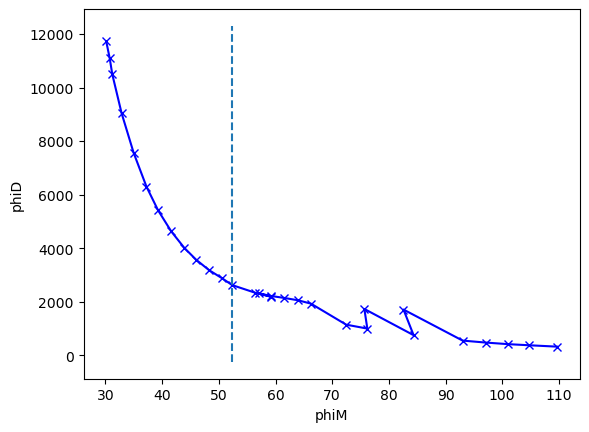

In [118]:

lambdas = np.logspace(np.log10(1000), np.log10(10), num=30)
phiD = []
phiM = []

for lam in lambdas:
    mgr.invert(f38_diag1_1, zWeight=0.5, lam=lam, verbose=True)
    phiD.append(mgr.inv.phiData())
    phiM.append(mgr.inv.phiModel())

phiD = np.array(phiD)
phiM = np.array(phiM)

from kneed import DataGenerator, KneeLocator
kneedle = KneeLocator(phiM, phiD, S=1.0, curve="convex", direction="decreasing",interp_method='interp1d')

print(round(kneedle.elbow, 3))
print(round(kneedle.knee_y, 3))
print(lambdas[np.where(phiM==kneedle.knee)[0]])

plt.xlabel('phiM')
plt.ylabel('phiD')
plt.plot(phiM, phiD, 'bx-')
plt.vlines(kneedle.knee, plt.ylim()[0], plt.ylim()[1], linestyles='dashed')


In [122]:
lambdas

array([1000.        ,  853.16785242,  727.8953844 ,  621.01694189,
        529.83169063,  452.03536564,  385.66204212,  329.03445623,
        280.72162039,  239.502662  ,  204.33597179,  174.33288222,
        148.73521073,  126.89610032,  108.26367339,   92.36708572,
         78.80462816,   67.23357536,   57.3615251 ,   48.93900918,
         41.75318937,   35.6224789 ,   30.39195382,   25.92943797,
         22.12216291,   18.87391822,   16.10262028,   13.73823796,
         11.72102298,   10.        ])

82.584
1705.974
[22.12216291]


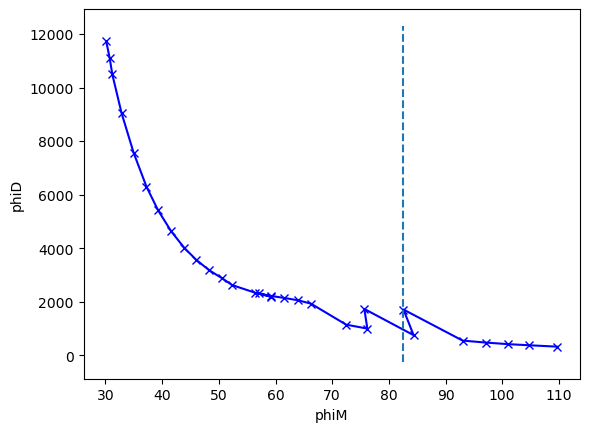

In [121]:
from kneed import DataGenerator, KneeLocator
kneedle = KneeLocator(phiM, phiD, online=True, curve="convex", direction="decreasing",interp_method='polynomial', polynomial_degree=3)

print(round(kneedle.elbow, 3))
print(round(kneedle.elbow_y, 3))
print(lambdas[np.where(phiM==kneedle.elbow)[0]])

plt.xlabel('phiM')
plt.ylabel('phiD')
plt.plot(phiM, phiD, 'bx-')
plt.vlines(kneedle.elbow, plt.ylim()[0], plt.ylim()[1], linestyles='dashed')



In [109]:
lambdas

array([1000.        ,  784.75997035,  615.84821107,  483.29302386,
        379.26901907,  297.63514416,  233.57214691,  183.29807108,
        143.84498883,  112.88378917,   88.58667904,   69.51927962,
         54.55594781,   42.81332399,   33.59818286,   26.36650899,
         20.69138081,   16.23776739,   12.74274986,   10.        ])

23/07/25 - 14:56:13 - pyGIMLi - INFO - Saving inversion results to: //smb.isipd.dmawi.de/projects/p_thinice/06_data/ERT_data/inversions/saved/f38_diag1_1\ERTManager


('//smb.isipd.dmawi.de/projects/p_thinice/06_data/ERT_data/inversions/saved/f38_diag1_1\\ERTManager',
 <Figure size 1600x1000 with 2 Axes>,
 <Axes: xlabel='$x$ in m', ylabel='Depth in m'>)

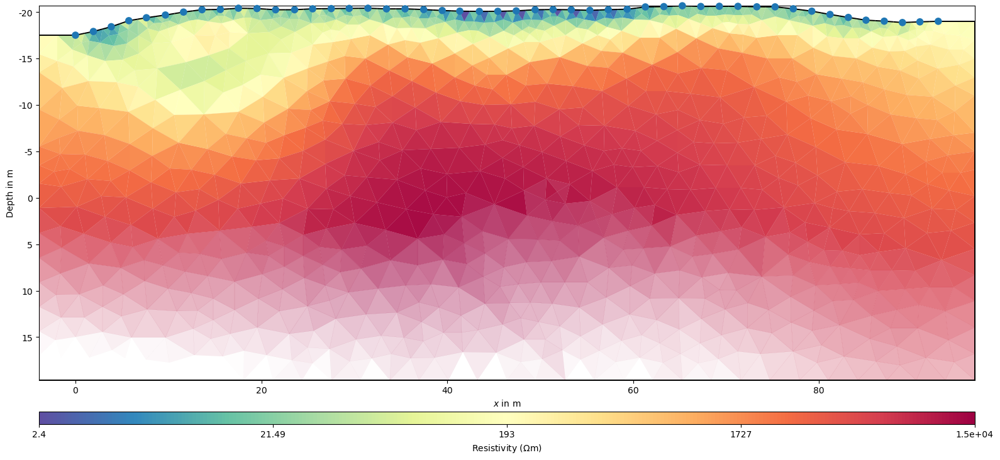

In [123]:
mgr.saveResult(dir + 'inversions/saved/f38_diag1_1')

In [26]:
struct_new = np.column_stack((xnew_struct, ynew[:82] - ynew_struct))

(<Axes: xlabel='$x$ in m', ylabel='Depth in m'>,
 <matplotlib.colorbar.Colorbar at 0x25ff096edd0>)

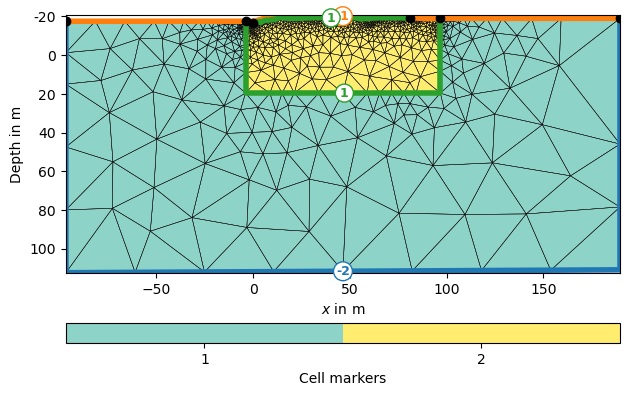

In [28]:
plc = mt.createParaMeshPLC(f38_diag1_1, boundary=1)
line = mt.createPolygon(struct_new, marker=1)
plc += line
mesh = mt.createMesh(plc, quality=34.3)
pg.show(mesh, markers=True, showMesh=True)

(10.0, 20.682)

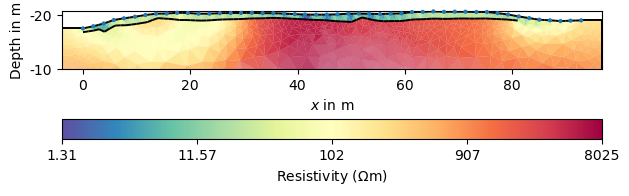

In [32]:
ax, cb = mgr.showResult()
ax.set_ylim(10)

In [14]:
f38_diag1_2 = ert.load(dir + 'raw_data/kamik_f38_diag1_02.txt')

In [122]:
rs = pd.read_csv(dir+'raw_data/kamik_f38_diag1_02_rs.csv', header=None)
rs = rs.to_numpy()

In [26]:
f38_diag1_2['err'] = f38_diag1_2['iperr'] + f38_diag1_2['err']

In [ ]:
f38_diag1_2["k0"] = ert.createGeometricFactors(f38_diag1_2)
f38_diag1_2["r"] = f38_diag1_2["rhoa"]/f38_diag1_2["k0"]


for i in range(f38_diag1_2.sensorCount()):
    x_new = f38_diag1_topo[0][i]  # Get x-value from diag1_topo[0]
    y_new = f38_diag1_topo[1][i]  # Get y-value from diag1_topo[1]
    f38_diag1_2.setSensorPosition(i, [x_new, y_new])


f38_diag1_2["k"] = ert.createGeometricFactors(f38_diag1_2, numerical=True)
f38_diag1_2["rhoa"] = f38_diag1_2["r"]*f38_diag1_2["k"]

30/07/25 - 15:12:46 - pyGIMLi - INFO - Save RVector binary
30/07/25 - 15:12:46 - pyGIMLi - INFO - Cache stored: C:\Users\mealiy001\AppData\Roaming\pygimli\Cache\4451000335219752239


30/07/25 - 15:12:46 - pyGIMLi - INFO - Create default mesh for geometric factor calculation.
30/07/25 - 15:12:56 - pyGIMLi - INFO - Save RVector binary
30/07/25 - 15:12:56 - pyGIMLi - INFO - Cache stored: C:\Users\mealiy001\AppData\Roaming\pygimli\Cache\5109637815142413370


In [16]:
plc = mt.createParaMeshPLC(f38_v1_1, paraMaxCellSize=1)
mesh = mt.createMesh(plc)

In [46]:
mgr = ert.ERTManager(v1[0])
mgr.invert(data=v1[0],verbose=True, lam=30, zWeight=0.5, mesh=mesh)

26/08/25 - 04:34:09 - pyGIMLi - INFO - Found 2 regions.
26/08/25 - 04:34:09 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (1) set to background.
26/08/25 - 04:34:09 - pyGIMLi - INFO - Creating forward mesh from region infos.
26/08/25 - 04:34:09 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
26/08/25 - 04:34:09 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 7649 Cells: 15032 Boundaries: 11406
26/08/25 - 04:34:09 - pyGIMLi - INFO - Use median(data values)=12180.45635953809
26/08/25 - 04:34:09 - pyGIMLi - INFO - Created startmodel from forward operator:2794, min/max=12180.456360/12180.456360
26/08/25 - 04:34:09 - pyGIMLi - INFO - Starting inversion.


fop: <pygimli.physics.ert.ertModelling.ERTModelling object at 0x000001585B9EC360>
Data transformation: Logarithmic LU transform, lower bound 0.0, upper bound 0.0
Model transformation (cumulative):
	 0 Logarithmic LU transform, lower bound 0.0, upper bound 0.0
min/max (data): 909/1.8e+05
min/max (error): 4.5e-04%/3.93%
min/max (start model): 1.2e+04/1.2e+04
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 93834699.10
--------------------------------------------------------------------------------
inv.iter 1 ... chi² = 3630520.81 (dPhi = 96.13%) lam: 30.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² = 3213291.61 (dPhi = 11.49%) lam: 30.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² = 2908943.50 (dPhi = 9.47%) lam: 30.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² = 2750

2794 [1012.716566905615,...,27320.5168102741]

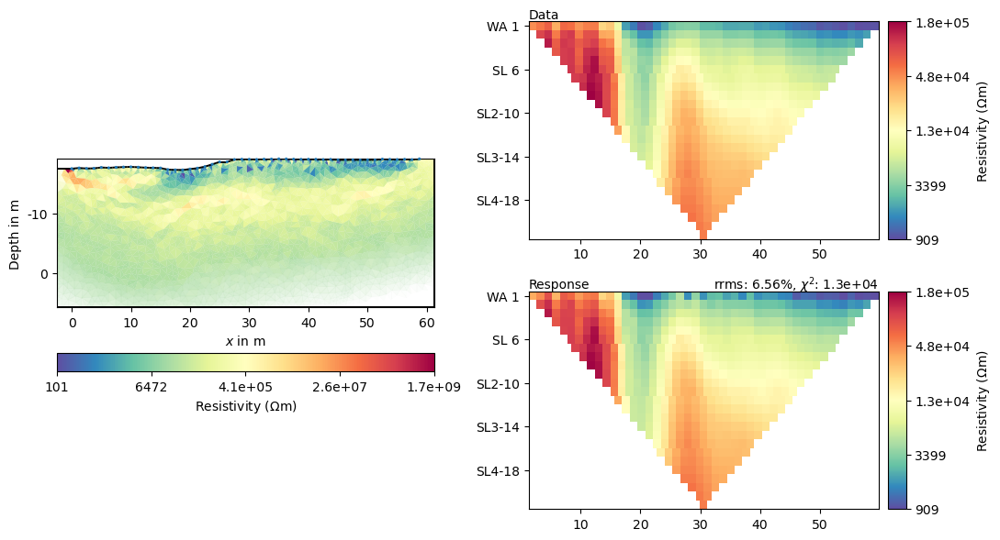

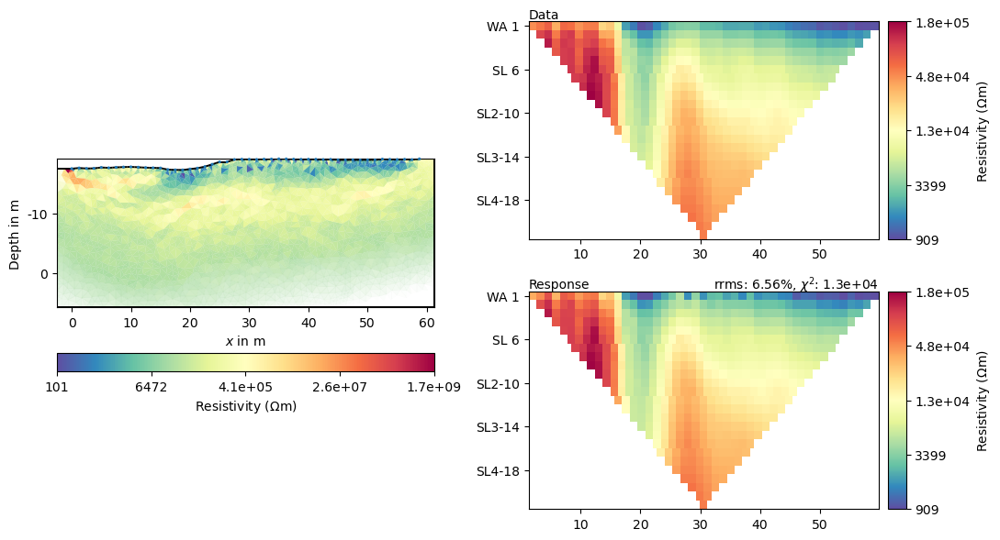

In [47]:
mgr.showResultAndFit()

In [17]:
tl = ert.TimelapseERT(v1, mesh=mesh)


26/08/25 - 03:51:26 - pyGIMLi - INFO - Found 2 regions.
26/08/25 - 03:51:26 - pyGIMLi - INFO - (ERTModelling) Region with smallest marker (1) set to background.
26/08/25 - 03:51:26 - pyGIMLi - INFO - Save RVector binary
26/08/25 - 03:51:26 - pyGIMLi - INFO - Cache stored: C:\Users\Expedition\AppData\Roaming\pygimli\Cache\6567331367873283008


26/08/25 - 03:52:16 - pyGIMLi - INFO - Found 2 regions.
26/08/25 - 03:52:16 - pyGIMLi - INFO - Region with smallest marker (1) set to background
26/08/25 - 03:52:16 - pyGIMLi - INFO - Creating forward mesh from region infos.
26/08/25 - 03:52:16 - pyGIMLi - INFO - Creating refined mesh (H2) to solve forward task.
26/08/25 - 03:52:16 - pyGIMLi - INFO - Mesh for forward task: Mesh: Nodes: 7649 Cells: 15032 Boundaries: 11406
26/08/25 - 03:52:17 - pyGIMLi - INFO - Starting inversion.


2794 model cells
Mesh: Nodes: 7649 Cells: 15032 Boundaries: 11406
fop: <pygimli.frameworks.timelapse.MultiFrameModelling object at 0x00000157CA938270>
Data transformation: Identity transform
Model transformation: Logarithmic transform
min/max (data): 3.3/1.6e+05
min/max (error): 3%/1.0e+10%
min/max (start model): 471/471
--------------------------------------------------------------------------------
inv.iter 0 ... chi² = 33186.95
--------------------------------------------------------------------------------
inv.iter 1 ... chi² = 3835.59 (dPhi = 88.38%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 2 ... chi² =  526.99 (dPhi = 85.31%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 3 ... chi² =  249.65 (dPhi = 46.66%) lam: 20.0
--------------------------------------------------------------------------------
inv.iter 4 ... chi² =  182.86 (dPhi = 25.48%) lam: 20.0
-----------------

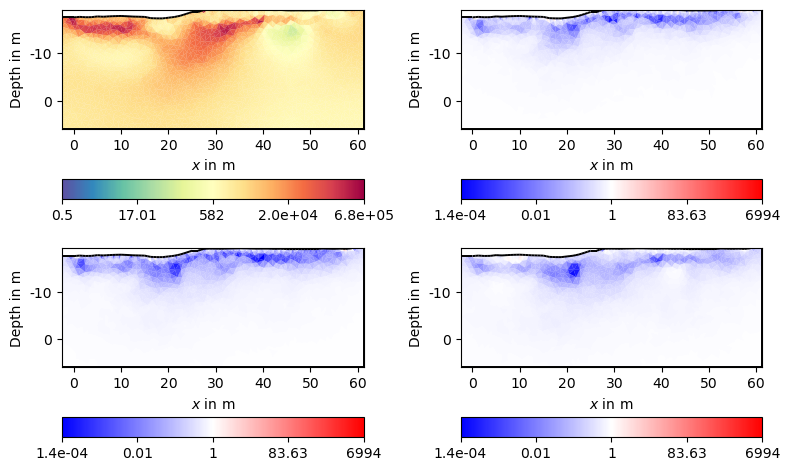

In [18]:

tl.fullInversion(mesh=mesh,zWeight=0.5, lam=20, verbose=True)
ax = tl.showAllModels(ratio=True)

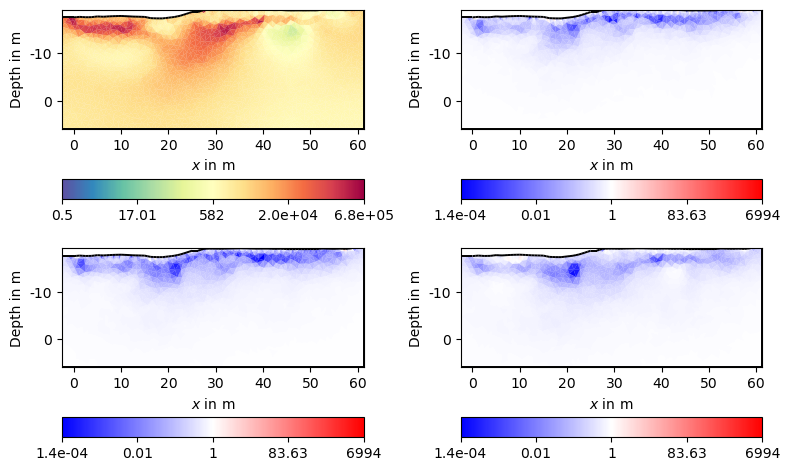

In [24]:
ax = tl.showAllModels(ratio=True, rMin=0.1)